In [1]:
import pandas as pd
import numpy as np

enigh = "/Users/emanuelalarcon/Documents/Bases de datos/ENIGH/2022/"

viviendas = pd.read_csv(enigh + "viviendas.csv")
ingresos = pd.read_csv(enigh + "ingresos.csv")
hogares = pd.read_csv(enigh + "hogares.csv")
poblacion = pd.read_csv(enigh + "poblacion.csv")
trabajos = pd.read_csv(enigh + "trabajos.csv")

/var/folders/41/pthbls9x1gq8_fgsh6fvh2zc0000gn/T/ipykernel_30750/412712659.py:6: DtypeWarning: Columns (4,24) have mixed types. Specify dtype option on import or set low_memory=False.
  viviendas = pd.read_csv(enigh + "viviendas.csv")
/var/folders/41/pthbls9x1gq8_fgsh6fvh2zc0000gn/T/ipykernel_30750/412712659.py:9: DtypeWarning: Columns (82,83,166) have mixed types. Specify dtype option on import or set low_memory=False.
  poblacion = pd.read_csv(enigh + "poblacion.csv")


# Funciones

In [2]:
mapeos = {
    "sexo": {
        1: "Hombre",
        2: "Mujer"
    },
    "edo_conyug": {
        1: "Vive con su pareja",
        2: "Está casado(a)",
        3: "Está separado(a)",
        4: "Está divorciado(a)",
        5: "Es viudo(a)",
        6: "Está soltero(a)"
    },
    "nivelaprob": {
        0: "Ninguno",
        1: "Preescolar",
        2: "Primaria",
        3: "Secundaria",
        4: "Preparatoria",
        5: "Normal",
        6: "Carrera técnica o comercial",
        7: "Profesional",
        8: "Maestría",
        9: "Doctorado"
    },
    "hablaind": {
        0: "No",
        1: "Sí"
    },
    "telefono": {
        1: "Sí",
        2: "No"
    },
    "tv_paga": {
        1: "Sí",
        2: "No"
    },
    "tarjeta": {
        1: "Sí",
        2: "No"
    },
    "celular": {
        1: "Sí",
        2: "No"
    },
    "conex_inte": {
        1: "Sí",
        2: "No"
    },
    "tipo_viv": {
        1: "Casa independiente",
        2: "Departamento en edificio",
        3: "Vivienda en vecindad",
        4: "Vivienda en cuarto de azotea",
        5: "Local no construido para habitación"
    },
    "tam_loc": {
        1: "Localidades con 100k y más habitantes",
        2: "Localidades con 15k a 99.9k habitantes",
        3: "Localidades con 2.5k a 14.9k habitantes",
        4: "Localidades con menos de 2.5k habitantes"
    },
    "mat_pared": {
        1: "Material de desecho",
        2: "Lámina de cartón",
        3: "Lámina de asbesto o metálica",
        4: "Carrizo bambú o palma",
        5: "Embarro o bajareque",
        6: "Madera",
        7: "Adobe",
        8: "Tabique, ladrillo, block, piedra, cantera, cemento o concreto"
    },
    "mat_techos": {
        1: "Material de desecho",
        2: "Lámina de cartón",
        3: "Lámina de metálica",
        4: "Lámina de asbesto",
        5: "Lámina de fibrocemento ondulada",
        6: "Palma o paja",
        7: "Madera o tejamil",
        8: "Terrado con viguería",
        9: "Teja",
        10: "Losa de concreto o viguetas con bovedilla"
    },
    "mat_pisos": {
        1: "Tierra",
        2: "Cemento o firme",
        3: "Madera, mosaico u otro recubrimiento"
    },
    "disp_agua": {
        1: "Agua entubada dentro de la vivienda",
        2: "Agua entubada fuera de la vivienda, pero dentro del terreno",
        3: "Agua entubada de llave pública",
        4: "Captadores de agua de lluvia",
        5: "Agua entubada que acarrean de otra vivienda",
        6: "Agua de pipa",
        7: "Agua de un pozo, río, lago, arroyo u otra"
    },
    "disp_elect": {
        1: "Del servicio público",
        2: "De una planta particular",
        3: "De panel solar",
        4: "De otra fuente",
        5: "No tiene luz eléctrica"
    },
    "cocina": {
        1: "Sí",
        2: "No"
    },
    "tenencia": {
        1: "Es rentada",
        2: "Es prestada",
        3: "Es propia, pero la están pagando",
        4: "Es propia",
        5: "Está intestada o en litigio",
        6: "Otra situación"
    },
    "arrendar": {
        1: "Sí",
        0: "No"
    },
    "entidad": {
    1: "Aguascalientes",
    2: "Baja California",
    3: "Baja California Sur",
    4: "Campeche",
    5: "Coahuila",
    6: "Colima",
    7: "Chiapas",
    8: "Chihuahua",
    9: "Ciudad de México",
    10: "Durango",
    11: "Guanajuato",
    12: "Guerrero",
    13: "Hidalgo",
    14: "Jalisco",
    15: "México",
    16: "Michoacán",
    17: "Morelos",
    18: "Nayarit",
    19: "Nuevo León",
    20: "Oaxaca",
    21: "Puebla",
    22: "Querétaro",
    23: "Quintana Roo",
    24: "San Luis Potosí",
    25: "Sinaloa",
    26: "Sonora",
    27: "Tabasco",
    28: "Tamaulipas",
    29: "Tlaxcala",
    30: "Veracruz",
    31: "Yucatán",
    32: "Zacatecas"
}
}


In [3]:
estado = {
    1: "Aguascalientes",
    2: "Baja California",
    3: "Baja California Sur",
    4: "Campeche",
    5: "Coahuila",
    6: "Colima",
    7: "Chiapas",
    8: "Chihuahua",
    9: "Ciudad de México",
    10: "Durango",
    11: "Guanajuato",
    12: "Guerrero",
    13: "Hidalgo",
    14: "Jalisco",
    15: "México",
    16: "Michoacán",
    17: "Morelos",
    18: "Nayarit",
    19: "Nuevo León",
    20: "Oaxaca",
    21: "Puebla",
    22: "Querétaro",
    23: "Quintana Roo",
    24: "San Luis Potosí",
    25: "Sinaloa",
    26: "Sonora",
    27: "Tabasco",
    28: "Tamaulipas",
    29: "Tlaxcala",
    30: "Veracruz",
    31: "Yucatán",
    32: "Zacatecas"
}

In [4]:
def asignarSexo(row):
    if row == 1:
        return "Hombre"
    else:
        return "Mujer"

In [5]:
def asignarEdoConyug(row):
    if row == 1:
        return "Vive con su pareja"
    elif row == 2:
        return "Está casado(a)"
    elif row == 3:
        return "Está separado(a)"
    elif row == 4:
        return "Está divorciado(a)"
    elif row == 5:
        return "Es viudo(a)"
    else:
        return "Está soltero(a)"

In [6]:
def asignarNivelAprob(row):
    if row == 0:
        return "Ninguno"
    elif row == 1:
        return "Preescolar"
    elif row == 2:
        return "Primaria"
    elif row == 3:
        return "Secundaria"
    elif row == 4:
        return "Preparatoria"
    elif row == 5:
        return "Normal"
    elif row == 6:
        return "Carrera técnica o comercial"
    elif row == 7:
        return "Profesional"
    elif row == 8:
        return "Maestría" 
    else:
        return "Doctorado"

In [7]:
def asignarHablaInd(row):
    if row == 0:
        return "No"
    else:
        return "Sí"

In [8]:
def asignarTelefono(row):
    if row == 1:
        return "Sí"
    else:
        return "No"

In [9]:
def asignarTVPaga(row):
    if row == 1:
        return "Sí"
    else:
        return "No"

In [10]:
def asignarTarjeta(row):
    if row == 1:
        return "Sí"
    else:
        return "No"

In [11]:
def asignarCelular(row):
    if row == 1:
        return "Sí"
    else:
        return "No"

In [12]:
def asignarConexInte(row):
    if row == 1:
        return "Sí"
    else:
        return "No"

In [13]:
def asignarTipoViv(row):
    if row == 1:
        return "Casa independiente"
    elif row == 2:
        return "Departamento en edificio"
    elif row == 3:
        return "Vivienda en vecindad"
    elif row == 4:
        return "Vivienda en cuarto de azotea"
    else:
        return "Local no construido para habitación"

In [14]:
def asignarTamLoc(row):
    if row == 1:
        return "Localidades con 100k y más habitantes"
    elif row == 2:
        return "Localidades con 15k a 99.9k habitantes"
    elif row == 3:
        return "Localidades con 2.5k a 14.9k habitantes"
    else:
        return "Localidades con menos de 2.5k habitantes"

In [15]:
def asignarMatPared(row):
    if row == 1:
        return "Material de desecho"
    elif row == 2:
        return "Lámina de cartón"
    elif row == 3:
        return "Lámina de asbesto o metálica"
    elif row == 4:
        return "Carrizo bambú o palma"
    elif row == 5:
        return "Embarro o bajareque"
    elif row == 6:
        return "Madera"
    elif row == 7:
        return "Adobe"
    else:
        return "Tabique, ladrillo, block, piedra, cantera, cemento o concreto"

In [16]:
def asignarMatTechos(row):
    if row == 1:
        return "Material de desecho"
    elif row == 2:
        return "Lámina de cartón"
    elif row == 3:
        return "Lámina de metálica"
    elif row == 4:
        return "Lámina de asbesto"
    elif row == 5:
        return "Lámina de fibrocemento ondulada"
    elif row == 6:
        return "Palma o paja"
    elif row == 7:
        return "Madera o tejamil"
    elif row == 8:
        return "Terrado con viguería"
    elif row == 9:
        return "Teja"
    else:
        return "Losa de concreto o viguetas con bovedilla"

In [17]:
def asignarMatPisos(row):
    if row == 1:
        return "Tierra"
    elif row == 2:
        return "Cemento o firme"
    else:
        return "Madera, mosaico u otro recubrimiento"

In [18]:
def asignarDispAgua(row):
    if row == 1:
        return "Agua entubada dentro de la vivienda"
    elif row == 2:
        return "Agua entubada fuera de la vivienda, pero dentro del terreno"
    elif row == 3:
        return "Agua entubada de llave pública"
    elif row == 4:
        return "Captadores de agua de lluvia"
    elif row == 5:
        return "Agua entubada que acarrean de otra vivienda"
    elif row == 6:
        return "Agua de pipa"
    else:
        return "Agua de un pozo, río, lago, arrouo u otra"

In [19]:
def asignarDispElect(row):
    if row == 1:
        return "Del servicio público"
    elif row == 2:
        return "De una planta particular"
    elif row == 3:
        return "De panel solar"
    elif row == 4:
        return "De otra fuente"
    else:
        return "No tiene luz eléctrica"

In [20]:
def asignarCocina(row):
    if row == 1:
        return "Sí"
    else:
        return "No"

In [21]:
def asignarTenencia(row):
    if row == 1:
        return "Es rentada"
    elif row == 2:
        return "Es prestada"
    elif row == 3:
        return "Es propia, pero la están pagando"
    elif row == 4:
        return "Es propia"
    elif row == 5:
        return "Está intestada o en litigio"
    else:
        return "Otra situación"

In [22]:
def asignarArrendar(row):
    if row == 1:
        return "Sí"
    else:
        return "No"

# Inicio

In [23]:
poblacion

,folioviv,foliohog,numren,parentesco,sexo,edad,madre_hog,madre_id,padre_hog,padre_id,...,motivo_aus,act_pnea1,act_pnea2,num_trabaj,c_futuro,ct_futuro,entidad,est_dis,upm,factor
0,100005002,1,1,101,2,91,2,,2,,...,,5,,,,,1,3,1,206
1,100005002,1,2,301,2,48,1,01,2,,...,,,,1,,,1,3,1,206
2,100005002,1,3,609,2,13,1,02,2,,...,,4,,,,,1,3,1,206
3,100005003,1,1,101,1,68,2,,2,,...,,,,1,,,1,3,1,206
4,100005003,1,2,201,2,64,2,,2,,...,,,,1,,,1,3,1,206
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
309679,3260797910,1,1,101,1,63,2,,2,,...,,,,1,,,32,560,10232,123
309680,3260797910,1,2,201,2,59,2,,2,,...,,,,1,,,32,560,10232,123
309681,3260797912,1,1,101,1,29,2,,2,,...,,,,1,,,32,560,10232,123
309682,3260797912,1,2,201,2,30,2,,2,,...,,,,1,,,32,560,10232,123


In [24]:
folioviv_counts = poblacion["folioviv"].value_counts()
foliohog_counts = poblacion["foliohog"].value_counts()
numren_counts = poblacion["numren"].value_counts()

In [25]:
valid_folioviv = folioviv_counts[folioviv_counts > 3].index
valid_foliohog = foliohog_counts[foliohog_counts > 1].index
valid_numren = numren_counts[numren_counts > 2].index

In [26]:
poblacion[(poblacion["folioviv"].isin(valid_folioviv)) & (poblacion["foliohog"].isin(valid_foliohog)) & (poblacion["numren"].isin(valid_numren))]

,folioviv,foliohog,numren,parentesco,sexo,edad,madre_hog,madre_id,padre_hog,padre_id,...,motivo_aus,act_pnea1,act_pnea2,num_trabaj,c_futuro,ct_futuro,entidad,est_dis,upm,factor
8,100012002,1,1,101,1,87,2,,2,,...,,2,,,,,1,2,2,167
9,100012002,1,2,201,2,80,2,,2,,...,,3,,,,,1,2,2,167
10,100012002,1,3,609,1,38,2,,2,,...,,1,,,,,1,2,2,167
11,100012002,1,4,609,2,22,2,,2,,...,,3,,,,,1,2,2,167
12,100012002,2,1,101,1,27,2,,2,,...,,,,1,,,1,2,2,167
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
309668,3260797706,1,6,301,1,5,1,02,1,01,...,,,,,,,32,560,10232,123
309675,3260797909,1,1,101,1,37,2,,2,,...,,,,1,,,32,560,10232,123
309676,3260797909,1,2,201,2,31,2,,2,,...,,3,,,,,32,560,10232,123
309677,3260797909,1,3,301,2,6,1,02,1,01,...,,,,,,,32,560,10232,123


In [27]:
poblacion.dtypes

folioviv       int64
foliohog       int64
numren         int64
parentesco     int64
sexo           int64
               ...  
ct_futuro     object
entidad        int64
est_dis        int64
upm            int64
factor         int64
Length: 188, dtype: object

In [28]:
poblacion.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 309684 entries, 0 to 309683
Columns: 188 entries, folioviv to factor
dtypes: int64(12), object(176)
memory usage: 444.2+ MB


In [29]:
print(poblacion.dtypes.nunique())

2


In [30]:
poblacion[poblacion["folioviv"] == 100012002]

,folioviv,foliohog,numren,parentesco,sexo,edad,madre_hog,madre_id,padre_hog,padre_id,...,motivo_aus,act_pnea1,act_pnea2,num_trabaj,c_futuro,ct_futuro,entidad,est_dis,upm,factor
8,100012002,1,1,101,1,87,2,,2,,...,,2,,,,,1,2,2,167
9,100012002,1,2,201,2,80,2,,2,,...,,3,,,,,1,2,2,167
10,100012002,1,3,609,1,38,2,,2,,...,,1,,,,,1,2,2,167
11,100012002,1,4,609,2,22,2,,2,,...,,3,,,,,1,2,2,167
12,100012002,2,1,101,1,27,2,,2,,...,,,,1,,,1,2,2,167


In [31]:
poblacion = poblacion[poblacion["edad"] > 17]
poblacion

,folioviv,foliohog,numren,parentesco,sexo,edad,madre_hog,madre_id,padre_hog,padre_id,...,motivo_aus,act_pnea1,act_pnea2,num_trabaj,c_futuro,ct_futuro,entidad,est_dis,upm,factor
0,100005002,1,1,101,2,91,2,,2,,...,,5,,,,,1,3,1,206
1,100005002,1,2,301,2,48,1,01,2,,...,,,,1,,,1,3,1,206
3,100005003,1,1,101,1,68,2,,2,,...,,,,1,,,1,3,1,206
4,100005003,1,2,201,2,64,2,,2,,...,,,,1,,,1,3,1,206
5,100005004,1,1,101,1,56,2,,2,,...,,,,1,,,1,3,1,206
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
309676,3260797909,1,2,201,2,31,2,,2,,...,,3,,,,,32,560,10232,123
309679,3260797910,1,1,101,1,63,2,,2,,...,,,,1,,,32,560,10232,123
309680,3260797910,1,2,201,2,59,2,,2,,...,,,,1,,,32,560,10232,123
309681,3260797912,1,1,101,1,29,2,,2,,...,,,,1,,,32,560,10232,123


In [32]:
# Se confirma que la tabla tiene valores una fila por persona encuestada
poblacion = poblacion[poblacion["edad"] < 61]
poblacion

,folioviv,foliohog,numren,parentesco,sexo,edad,madre_hog,madre_id,padre_hog,padre_id,...,motivo_aus,act_pnea1,act_pnea2,num_trabaj,c_futuro,ct_futuro,entidad,est_dis,upm,factor
1,100005002,1,2,301,2,48,1,01,2,,...,,,,1,,,1,3,1,206
5,100005004,1,1,101,1,56,2,,2,,...,,,,1,,,1,3,1,206
6,100005004,1,2,201,2,53,2,,2,,...,,3,,,,,1,3,1,206
7,100005004,1,3,301,1,30,1,02,1,01,...,,,,1,,,1,3,1,206
10,100012002,1,3,609,1,38,2,,2,,...,,1,,,,,1,2,2,167
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
309675,3260797909,1,1,101,1,37,2,,2,,...,,,,1,,,32,560,10232,123
309676,3260797909,1,2,201,2,31,2,,2,,...,,3,,,,,32,560,10232,123
309680,3260797910,1,2,201,2,59,2,,2,,...,,,,1,,,32,560,10232,123
309681,3260797912,1,1,101,1,29,2,,2,,...,,,,1,,,32,560,10232,123


In [33]:
trabajos

,folioviv,foliohog,numren,id_trabajo,trapais,subor,indep,personal,pago,contrato,...,medtrab_2,medtrab_3,medtrab_4,medtrab_5,medtrab_6,medtrab_7,entidad,est_dis,upm,factor
0,100005002,1,2,1,1,1,,,1,1,...,2,,,,,,1,3,1,206
1,100005003,1,1,1,1,1,,,1,1,...,,,,,,,1,3,1,206
2,100005003,1,2,1,1,1,,,1,1,...,,,,,,,1,3,1,206
3,100005004,1,1,1,1,2,1,1,,,...,,,,,,,1,3,1,206
4,100005004,1,3,1,1,1,,,1,1,...,,,,,,,1,3,1,206
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
165001,3260797909,1,1,1,1,1,,,1,2,...,,,,,,7,32,560,10232,123
165002,3260797910,1,1,1,1,2,1,1,,,...,,,,,,,32,560,10232,123
165003,3260797910,1,2,1,1,1,,,3,,...,,,,,,,32,560,10232,123
165004,3260797912,1,1,1,1,2,1,1,,,...,,,,,,7,32,560,10232,123


In [34]:
trabajos.dtypes

folioviv       int64
foliohog       int64
numren         int64
id_trabajo     int64
trapais        int64
subor          int64
indep         object
personal      object
pago          object
contrato      object
tipocontr     object
pres_1        object
pres_2        object
pres_3        object
pres_4        object
pres_5        object
pres_6        object
pres_7        object
pres_8        object
pres_9        object
pres_10       object
pres_11       object
pres_12       object
pres_13       object
pres_14       object
pres_15       object
pres_16       object
pres_17       object
pres_18       object
pres_19       object
pres_20       object
htrab          int64
sinco          int64
scian          int64
clas_emp      object
tam_emp        int64
no_ing        object
tiene_suel    object
tipoact       object
socios        object
soc_nr1       object
soc_nr2       object
soc_resp      object
otra_act      object
tipoact2      object
tipoact3      object
tipoact4      object
lugar        

In [35]:
trabajos.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 165006 entries, 0 to 165005
Data columns (total 60 columns):
 #   Column      Non-Null Count   Dtype 
---  ------      --------------   ----- 
 0   folioviv    165006 non-null  int64 
 1   foliohog    165006 non-null  int64 
 2   numren      165006 non-null  int64 
 3   id_trabajo  165006 non-null  int64 
 4   trapais     165006 non-null  int64 
 5   subor       165006 non-null  int64 
 6   indep       165006 non-null  object
 7   personal    165006 non-null  object
 8   pago        165006 non-null  object
 9   contrato    165006 non-null  object
 10  tipocontr   165006 non-null  object
 11  pres_1      165006 non-null  object
 12  pres_2      165006 non-null  object
 13  pres_3      165006 non-null  object
 14  pres_4      165006 non-null  object
 15  pres_5      165006 non-null  object
 16  pres_6      165006 non-null  object
 17  pres_7      165006 non-null  object
 18  pres_8      165006 non-null  object
 19  pres_9      165006 non-

In [36]:
print(trabajos.dtypes.nunique())

2


In [37]:
trabajos[trabajos["medtrab_1"] == "1"]

,folioviv,foliohog,numren,id_trabajo,trapais,subor,indep,personal,pago,contrato,...,medtrab_2,medtrab_3,medtrab_4,medtrab_5,medtrab_6,medtrab_7,entidad,est_dis,upm,factor
1,100005003,1,1,1,1,1,,,1,1,...,,,,,,,1,3,1,206
2,100005003,1,2,1,1,1,,,1,1,...,,,,,,,1,3,1,206
4,100005004,1,3,1,1,1,,,1,1,...,,,,,,,1,3,1,206
7,100012004,1,2,1,1,1,,,1,1,...,,,,,,,1,2,2,167
9,100012006,1,1,1,1,1,,,1,1,...,,,,,,,1,2,2,167
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
164957,3260788803,1,3,1,1,1,,,1,1,...,,,,,,,32,560,10231,126
164961,3260788805,1,1,1,1,1,,,1,2,...,,,,,,,32,560,10231,126
164970,3260797214,1,3,1,1,1,,,1,1,...,,,,,,,32,560,10232,123
164974,3260797216,1,1,1,1,1,,,1,2,...,,,,,,,32,560,10232,123


In [38]:
trabajos[trabajos["medtrab_2"] == "2"]

,folioviv,foliohog,numren,id_trabajo,trapais,subor,indep,personal,pago,contrato,...,medtrab_2,medtrab_3,medtrab_4,medtrab_5,medtrab_6,medtrab_7,entidad,est_dis,upm,factor
0,100005002,1,2,1,1,1,,,1,1,...,2,,,,,,1,3,1,206
23,100048303,1,1,1,1,1,,,1,1,...,2,,,,,,1,1,5,165
32,100050502,1,2,1,1,1,,,1,1,...,2,,,,,,1,2,6,198
39,100055501,1,1,1,1,1,,,1,1,...,2,,,,,,1,1,7,141
152,100161704,1,2,1,1,1,,,1,1,...,2,,,,,,1,2,21,154
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
164922,3260787414,1,1,1,1,1,,,1,1,...,2,,,,,,32,560,10230,98
164934,3260787903,1,1,1,1,1,,,1,1,...,2,,,,,,32,560,10230,98
164944,3260788012,1,1,1,1,1,,,1,1,...,2,,,,,,32,560,10231,126
164949,3260788520,1,1,1,1,1,,,1,1,...,2,,,,,,32,560,10231,126


In [39]:
trabajos[trabajos["medtrab_3"] == "3"]

,folioviv,foliohog,numren,id_trabajo,trapais,subor,indep,personal,pago,contrato,...,medtrab_2,medtrab_3,medtrab_4,medtrab_5,medtrab_6,medtrab_7,entidad,est_dis,upm,factor
105,100134205,1,3,1,1,1,,,1,1,...,,3,,,,,1,2,14,184
400,100465301,1,2,1,1,1,,,1,1,...,2,3,,,,,1,2,56,182
430,100468504,1,1,1,1,1,,,1,1,...,,3,,,,,1,2,58,187
799,100809205,1,1,1,1,1,,,1,1,...,,3,,,,,1,2,103,187
929,100929705,1,2,1,1,1,,,1,2,...,,3,,,,,1,2,120,205
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
162939,3202048010,1,1,1,1,1,,,1,1,...,,3,,,,,32,558,10169,168
162976,3202068203,1,2,1,1,1,,,1,1,...,,3,,,,,32,557,10170,147
162991,3202068615,1,2,1,1,1,,,1,2,...,,3,,,,,32,557,10170,147
163718,3260288412,1,2,1,1,1,,,1,1,...,,3,,,,,32,560,10192,160


In [40]:
trabajos[trabajos["medtrab_4"] == "4"]

,folioviv,foliohog,numren,id_trabajo,trapais,subor,indep,personal,pago,contrato,...,medtrab_2,medtrab_3,medtrab_4,medtrab_5,medtrab_6,medtrab_7,entidad,est_dis,upm,factor
1785,101506005,1,3,1,1,1,,,1,1,...,,,4,,,,1,2,206,172
1786,101506005,1,4,1,1,1,,,1,1,...,,,4,,,,1,2,206,172
2312,102005914,1,1,1,1,1,,,1,1,...,,,4,,,,1,7,263,150
5137,200694601,1,2,1,1,1,,,1,1,...,,,4,,,,2,23,369,463
5577,202104302,1,1,1,1,1,,,1,1,...,,,4,,,,2,19,431,663
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
161745,3200940202,1,1,1,1,1,,,1,1,...,,,4,,,,32,551,10115,154
161746,3200940202,1,2,1,1,1,,,1,1,...,,,4,,,,32,551,10115,154
162577,3201678611,1,1,1,1,1,,,1,1,...,,,4,,,,32,556,10159,143
162583,3201678817,1,1,1,1,1,,,1,1,...,,,4,,,,32,556,10159,143


In [41]:
trabajos[(trabajos["medtrab_1"] == " ") & (trabajos["medtrab_2"] == " ") & (trabajos["medtrab_3"] == " ")]

,folioviv,foliohog,numren,id_trabajo,trapais,subor,indep,personal,pago,contrato,...,medtrab_2,medtrab_3,medtrab_4,medtrab_5,medtrab_6,medtrab_7,entidad,est_dis,upm,factor
3,100005004,1,1,1,1,2,1,1,,,...,,,,,,,1,3,1,206
5,100012002,2,1,1,1,1,,,1,2,...,,,,,,7,1,2,2,167
6,100012004,1,1,1,1,2,1,1,,,...,,,,,,,1,2,2,167
8,100012004,1,3,1,1,1,,,1,2,...,,,,,,7,1,2,2,167
10,100019302,1,1,1,1,2,1,1,,,...,,,,,,,1,3,3,212
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
165001,3260797909,1,1,1,1,1,,,1,2,...,,,,,,7,32,560,10232,123
165002,3260797910,1,1,1,1,2,1,1,,,...,,,,,,,32,560,10232,123
165003,3260797910,1,2,1,1,1,,,3,,...,,,,,,,32,560,10232,123
165004,3260797912,1,1,1,1,2,1,1,,,...,,,,,,7,32,560,10232,123


In [42]:
# No tiene servicios médicos
# Se considera informal
trabajos = trabajos[(trabajos["medtrab_7"] == "7")]
trabajos

,folioviv,foliohog,numren,id_trabajo,trapais,subor,indep,personal,pago,contrato,...,medtrab_2,medtrab_3,medtrab_4,medtrab_5,medtrab_6,medtrab_7,entidad,est_dis,upm,factor
5,100012002,2,1,1,1,1,,,1,2,...,,,,,,7,1,2,2,167
8,100012004,1,3,1,1,1,,,1,2,...,,,,,,7,1,2,2,167
11,100019302,1,2,1,1,1,,,1,1,...,,,,,,7,1,3,3,212
17,100023305,1,1,1,1,1,,,1,2,...,,,,,,7,1,2,4,184
18,100023305,1,2,1,1,1,,,1,2,...,,,,,,7,1,2,4,184
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
164997,3260797907,1,1,1,1,1,,,1,2,...,,,,,,7,32,560,10232,123
164999,3260797908,1,1,2,1,1,,,1,2,...,,,,,,7,32,560,10232,123
165000,3260797908,1,2,1,1,1,,,1,2,...,,,,,,7,32,560,10232,123
165001,3260797909,1,1,1,1,1,,,1,2,...,,,,,,7,32,560,10232,123


In [43]:
# Validar que estén dentro de la PEA
trabajos = trabajos[trabajos["trapais"] == 1]
trabajos

,folioviv,foliohog,numren,id_trabajo,trapais,subor,indep,personal,pago,contrato,...,medtrab_2,medtrab_3,medtrab_4,medtrab_5,medtrab_6,medtrab_7,entidad,est_dis,upm,factor
5,100012002,2,1,1,1,1,,,1,2,...,,,,,,7,1,2,2,167
8,100012004,1,3,1,1,1,,,1,2,...,,,,,,7,1,2,2,167
11,100019302,1,2,1,1,1,,,1,1,...,,,,,,7,1,3,3,212
17,100023305,1,1,1,1,1,,,1,2,...,,,,,,7,1,2,4,184
18,100023305,1,2,1,1,1,,,1,2,...,,,,,,7,1,2,4,184
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
164997,3260797907,1,1,1,1,1,,,1,2,...,,,,,,7,32,560,10232,123
164999,3260797908,1,1,2,1,1,,,1,2,...,,,,,,7,32,560,10232,123
165000,3260797908,1,2,1,1,1,,,1,2,...,,,,,,7,32,560,10232,123
165001,3260797909,1,1,1,1,1,,,1,2,...,,,,,,7,32,560,10232,123


In [44]:
# El enfoque es personas con un trabajo informal de 18 a 60 años
# Por lo tanto, a la tabla trabajos se le hará inner join con personas
objetivo = trabajos.merge(poblacion, on=["folioviv", "foliohog", "numren"], how="inner")
objetivo

,folioviv,foliohog,numren,id_trabajo,trapais,subor,indep,personal,pago,contrato,...,motivo_aus,act_pnea1,act_pnea2,num_trabaj,c_futuro,ct_futuro,entidad_y,est_dis_y,upm_y,factor_y
0,100012002,2,1,1,1,1,,,1,2,...,,,,1,,,1,2,2,167
1,100012004,1,3,1,1,1,,,1,2,...,,,,1,,,1,2,2,167
2,100019302,1,2,1,1,1,,,1,1,...,,,,1,,,1,3,3,212
3,100023305,1,1,1,1,1,,,1,2,...,,,,1,,,1,2,4,184
4,100023305,1,2,1,1,1,,,1,2,...,,,,1,,,1,2,4,184
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
50984,3260797907,1,1,1,1,1,,,1,2,...,,,,1,,,32,560,10232,123
50985,3260797908,1,1,2,1,1,,,1,2,...,,,,2,,,32,560,10232,123
50986,3260797908,1,2,1,1,1,,,1,2,...,,,,1,,,32,560,10232,123
50987,3260797909,1,1,1,1,1,,,1,2,...,,,,1,,,32,560,10232,123


In [45]:
list(objetivo.columns)

['folioviv',
 'foliohog',
 'numren',
 'id_trabajo',
 'trapais',
 'subor',
 'indep',
 'personal',
 'pago',
 'contrato',
 'tipocontr',
 'pres_1',
 'pres_2',
 'pres_3',
 'pres_4',
 'pres_5',
 'pres_6',
 'pres_7',
 'pres_8',
 'pres_9',
 'pres_10',
 'pres_11',
 'pres_12',
 'pres_13',
 'pres_14',
 'pres_15',
 'pres_16',
 'pres_17',
 'pres_18',
 'pres_19',
 'pres_20',
 'htrab',
 'sinco',
 'scian',
 'clas_emp',
 'tam_emp',
 'no_ing',
 'tiene_suel',
 'tipoact',
 'socios',
 'soc_nr1',
 'soc_nr2',
 'soc_resp',
 'otra_act',
 'tipoact2',
 'tipoact3',
 'tipoact4',
 'lugar',
 'conf_pers',
 'medtrab_1',
 'medtrab_2',
 'medtrab_3',
 'medtrab_4',
 'medtrab_5',
 'medtrab_6',
 'medtrab_7',
 'entidad_x',
 'est_dis_x',
 'upm_x',
 'factor_x',
 'parentesco',
 'sexo',
 'edad',
 'madre_hog',
 'madre_id',
 'padre_hog',
 'padre_id',
 'disc_camin',
 'disc_ver',
 'disc_brazo',
 'disc_apren',
 'disc_oir',
 'disc_vest',
 'disc_habla',
 'disc_acti',
 'cau_camin',
 'cau_ver',
 'cau_brazo',
 'cau_apren',
 'cau_oir',
 'c

In [46]:
ingresos

,folioviv,foliohog,numren,clave,mes_1,mes_2,mes_3,mes_4,mes_5,mes_6,...,ing_2,ing_3,ing_4,ing_5,ing_6,ing_tri,entidad,est_dis,upm,factor
0,100005002,1,1,P104,10,09,08,07,06,05,...,0,7600,0,0,7600,7434.78,1,3,1,206
1,100005002,1,2,P001,10,09,08,07,06,05,...,11500,11500,11500,11500,11500,33749.99,1,3,1,206
2,100005002,1,2,P009,,,,,,,...,,,,,,1956.52,1,3,1,206
3,100005002,1,3,P037,10,09,08,07,06,05,...,0,0,0,0,0,391.30,1,3,1,206
4,100005002,1,3,P041,10,09,08,07,06,05,...,0,0,0,1000,0,978.26,1,3,1,206
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
397177,3260797908,1,2,P001,10,09,08,07,06,05,...,0,1000,1600,1000,800,2543.47,32,560,10232,123
397178,3260797909,1,1,P001,10,09,08,07,06,05,...,9000,9000,9000,9000,9000,26413.04,32,560,10232,123
397179,3260797910,1,1,P069,10,09,08,07,06,05,...,43068,48340,48340,43068,48340,136709.99,32,560,10232,123
397180,3260797912,1,1,P070,10,09,08,07,06,05,...,8400,8400,8100,8400,8400,24358.69,32,560,10232,123


In [47]:
ingresos.dtypes

folioviv      int64
foliohog      int64
numren        int64
clave        object
mes_1        object
mes_2        object
mes_3        object
mes_4        object
mes_5        object
mes_6        object
ing_1         int64
ing_2        object
ing_3        object
ing_4        object
ing_5        object
ing_6        object
ing_tri     float64
entidad       int64
est_dis       int64
upm           int64
factor        int64
dtype: object

In [48]:
ingresos.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 397182 entries, 0 to 397181
Data columns (total 21 columns):
 #   Column    Non-Null Count   Dtype  
---  ------    --------------   -----  
 0   folioviv  397182 non-null  int64  
 1   foliohog  397182 non-null  int64  
 2   numren    397182 non-null  int64  
 3   clave     397182 non-null  object 
 4   mes_1     397182 non-null  object 
 5   mes_2     397182 non-null  object 
 6   mes_3     397182 non-null  object 
 7   mes_4     397182 non-null  object 
 8   mes_5     397182 non-null  object 
 9   mes_6     397182 non-null  object 
 10  ing_1     397182 non-null  int64  
 11  ing_2     397182 non-null  object 
 12  ing_3     397182 non-null  object 
 13  ing_4     397182 non-null  object 
 14  ing_5     397182 non-null  object 
 15  ing_6     397182 non-null  object 
 16  ing_tri   397182 non-null  float64
 17  entidad   397182 non-null  int64  
 18  est_dis   397182 non-null  int64  
 19  upm       397182 non-null  int64  
 20  fact

In [49]:
print(ingresos.dtypes.unique())

[dtype('int64') dtype('O') dtype('float64')]


In [50]:
# De la tabla ingresos solo importa el ingreso trimestral
ingresos = ingresos[["folioviv", "foliohog", "numren", "ing_tri"]]
ingresos

,folioviv,foliohog,numren,ing_tri
0,100005002,1,1,7434.78
1,100005002,1,2,33749.99
2,100005002,1,2,1956.52
3,100005002,1,3,391.30
4,100005002,1,3,978.26
...,...,...,...,...
397177,3260797908,1,2,2543.47
397178,3260797909,1,1,26413.04
397179,3260797910,1,1,136709.99
397180,3260797912,1,1,24358.69


In [51]:
# Sumar el ingreso trimestral de para tener una fila única por persona
provisional = ingresos.groupby(["folioviv", "foliohog", "numren"]).agg(ing_tri_persona=("ing_tri", "sum")).reset_index()
provisional

,folioviv,foliohog,numren,ing_tri_persona
0,100005002,1,1,7434.78
1,100005002,1,2,35706.51
2,100005002,1,3,1369.56
3,100005003,1,1,78016.28
4,100005003,1,2,21032.60
...,...,...,...,...
205139,3260797908,1,2,2543.47
205140,3260797909,1,1,26413.04
205141,3260797910,1,1,136709.99
205142,3260797912,1,1,24358.69


In [52]:
provisional["ing_men_persona"] = (provisional["ing_tri_persona"] / 3).round(2)
provisional

,folioviv,foliohog,numren,ing_tri_persona,ing_men_persona
0,100005002,1,1,7434.78,2478.26
1,100005002,1,2,35706.51,11902.17
2,100005002,1,3,1369.56,456.52
3,100005003,1,1,78016.28,26005.43
4,100005003,1,2,21032.60,7010.87
...,...,...,...,...,...
205139,3260797908,1,2,2543.47,847.82
205140,3260797909,1,1,26413.04,8804.35
205141,3260797910,1,1,136709.99,45570.00
205142,3260797912,1,1,24358.69,8119.56


In [53]:
# Me quedo con los datos que me importan para juntarlos con mi tabla objetivo
ingresos = provisional[["folioviv", "foliohog", "numren", "ing_men_persona"]]
ingresos

,folioviv,foliohog,numren,ing_men_persona
0,100005002,1,1,2478.26
1,100005002,1,2,11902.17
2,100005002,1,3,456.52
3,100005003,1,1,26005.43
4,100005003,1,2,7010.87
...,...,...,...,...
205139,3260797908,1,2,847.82
205140,3260797909,1,1,8804.35
205141,3260797910,1,1,45570.00
205142,3260797912,1,1,8119.56


In [54]:
objetivo[["entidad_x", "entidad_y", "factor_x", "factor_y"]]

,entidad_x,entidad_y,factor_x,factor_y
0,1,1,167,167
1,1,1,167,167
2,1,1,212,212
3,1,1,184,184
4,1,1,184,184
...,...,...,...,...
50984,32,32,123,123
50985,32,32,123,123
50986,32,32,123,123
50987,32,32,123,123


In [55]:
objetivo["nivelaprob"]

0        4
1        4
2        7
3        4
4        3
        ..
50984    3
50985    3
50986    2
50987    2
50988    7
Name: nivelaprob, Length: 50989, dtype: object

In [56]:
# Hay variables que no son de interés en la tabla
# Por lo tanto, se conservarán solo las columnas deseadas
# Objetivo solo me sirvio para tener a mi población objetivo, no se utilizarán las variables para el análisis
objetivo = objetivo[["folioviv", "foliohog", "numren", "sexo", "edad", "edo_conyug", "nivelaprob", "hablaind","entidad_x", "factor_y"]]
objetivo

,folioviv,foliohog,numren,sexo,edad,edo_conyug,nivelaprob,hablaind,entidad_x,factor_y
0,100012002,2,1,1,27,6,4,2,1,167
1,100012004,1,3,1,18,6,4,2,1,167
2,100019302,1,2,2,40,6,7,2,1,212
3,100023305,1,1,1,43,2,4,2,1,184
4,100023305,1,2,2,35,2,3,2,1,184
...,...,...,...,...,...,...,...,...,...,...
50984,3260797907,1,1,1,28,2,3,2,32,123
50985,3260797908,1,1,1,52,2,3,2,32,123
50986,3260797908,1,2,2,50,2,2,2,32,123
50987,3260797909,1,1,1,37,2,2,2,32,123


In [57]:
objetivo.dtypes

folioviv       int64
foliohog       int64
numren         int64
sexo           int64
edad           int64
edo_conyug    object
nivelaprob    object
hablaind      object
entidad_x      int64
factor_y       int64
dtype: object

In [58]:
ingresos

,folioviv,foliohog,numren,ing_men_persona
0,100005002,1,1,2478.26
1,100005002,1,2,11902.17
2,100005002,1,3,456.52
3,100005003,1,1,26005.43
4,100005003,1,2,7010.87
...,...,...,...,...
205139,3260797908,1,2,847.82
205140,3260797909,1,1,8804.35
205141,3260797910,1,1,45570.00
205142,3260797912,1,1,8119.56


In [59]:
objetivo

,folioviv,foliohog,numren,sexo,edad,edo_conyug,nivelaprob,hablaind,entidad_x,factor_y
0,100012002,2,1,1,27,6,4,2,1,167
1,100012004,1,3,1,18,6,4,2,1,167
2,100019302,1,2,2,40,6,7,2,1,212
3,100023305,1,1,1,43,2,4,2,1,184
4,100023305,1,2,2,35,2,3,2,1,184
...,...,...,...,...,...,...,...,...,...,...
50984,3260797907,1,1,1,28,2,3,2,32,123
50985,3260797908,1,1,1,52,2,3,2,32,123
50986,3260797908,1,2,2,50,2,2,2,32,123
50987,3260797909,1,1,1,37,2,2,2,32,123


In [60]:
# Juntar los ingresos con la tabla objetivo
# A la tabla objetivo se le hará un inner join
objetivo = objetivo.merge(ingresos, on=["folioviv", "foliohog", "numren"], how="inner")
objetivo

,folioviv,foliohog,numren,sexo,edad,edo_conyug,nivelaprob,hablaind,entidad_x,factor_y,ing_men_persona
0,100012002,2,1,1,27,6,4,2,1,167,8070.65
1,100012004,1,3,1,18,6,4,2,1,167,1304.35
2,100019302,1,2,2,40,6,7,2,1,212,3913.04
3,100023305,1,1,1,43,2,4,2,1,184,7043.48
4,100023305,1,2,2,35,2,3,2,1,184,1369.56
...,...,...,...,...,...,...,...,...,...,...,...
50920,3260797907,1,1,1,28,2,3,2,32,123,10402.17
50921,3260797908,1,1,1,52,2,3,2,32,123,4108.69
50922,3260797908,1,2,2,50,2,2,2,32,123,847.82
50923,3260797909,1,1,1,37,2,2,2,32,123,8804.35


In [61]:
new_column_order = ["folioviv", "foliohog", "numren", "sexo", "edad", 
                    "edo_conyug", "nivelaprob", "hablaind", "ing_men_persona", 
                    "entidad_x", "factor_y"]

In [62]:
objetivo = objetivo[new_column_order]
objetivo

,folioviv,foliohog,numren,sexo,edad,edo_conyug,nivelaprob,hablaind,ing_men_persona,entidad_x,factor_y
0,100012002,2,1,1,27,6,4,2,8070.65,1,167
1,100012004,1,3,1,18,6,4,2,1304.35,1,167
2,100019302,1,2,2,40,6,7,2,3913.04,1,212
3,100023305,1,1,1,43,2,4,2,7043.48,1,184
4,100023305,1,2,2,35,2,3,2,1369.56,1,184
...,...,...,...,...,...,...,...,...,...,...,...
50920,3260797907,1,1,1,28,2,3,2,10402.17,32,123
50921,3260797908,1,1,1,52,2,3,2,4108.69,32,123
50922,3260797908,1,2,2,50,2,2,2,847.82,32,123
50923,3260797909,1,1,1,37,2,2,2,8804.35,32,123


In [63]:
objetivo.columns = ["folioviv", "foliohog", "numren", "sexo", "edad",
                    "edo_conyug", "nivelaprob", "hablaind", "ing_men_persona", 
                    "entidad", "factor"]

In [64]:
objetivo

,folioviv,foliohog,numren,sexo,edad,edo_conyug,nivelaprob,hablaind,ing_men_persona,entidad,factor
0,100012002,2,1,1,27,6,4,2,8070.65,1,167
1,100012004,1,3,1,18,6,4,2,1304.35,1,167
2,100019302,1,2,2,40,6,7,2,3913.04,1,212
3,100023305,1,1,1,43,2,4,2,7043.48,1,184
4,100023305,1,2,2,35,2,3,2,1369.56,1,184
...,...,...,...,...,...,...,...,...,...,...,...
50920,3260797907,1,1,1,28,2,3,2,10402.17,32,123
50921,3260797908,1,1,1,52,2,3,2,4108.69,32,123
50922,3260797908,1,2,2,50,2,2,2,847.82,32,123
50923,3260797909,1,1,1,37,2,2,2,8804.35,32,123


In [65]:
hogares

,folioviv,foliohog,huespedes,huesp_come,num_trab_d,trab_come,acc_alim1,acc_alim2,acc_alim3,acc_alim4,...,otros_lts,diconsa,frec_dicon,cond_dicon,pago_dicon,otro_pago,entidad,est_dis,upm,factor
0,100005002,1,0,,0,,2,2,2,2,...,,2,,,,,1,3,1,206
1,100005003,1,0,,0,,2,2,2,2,...,,2,,,,,1,3,1,206
2,100005004,1,0,,0,,2,1,2,2,...,,2,,,,,1,3,1,206
3,100012002,1,0,,0,,2,2,2,2,...,,9,,,,,1,2,2,167
4,100012002,2,0,,0,,2,2,2,2,...,,9,,,,,1,2,2,167
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
90097,3260797907,1,0,,0,,2,2,1,2,...,,2,,,,,32,560,10232,123
90098,3260797908,1,0,,0,,2,2,2,2,...,,2,,,,,32,560,10232,123
90099,3260797909,1,0,,0,,1,2,2,2,...,,2,,,,,32,560,10232,123
90100,3260797910,1,0,,0,,2,2,2,2,...,,2,,,,,32,560,10232,123


In [66]:
# Sigue teniendo sentido que aprox. 50% es informal, sin hacer un análisis exhaustivo
print(hogares.folioviv.nunique())
print(objetivo.folioviv.nunique())

88823
36266


In [67]:
hogares["alim17_4"]

0        7
1        7
2        6
3        7
4        4
        ..
90097    7
90098    2
90099    7
90100    7
90101    7
Name: alim17_4, Length: 90102, dtype: int64

In [68]:
# Si uno la tabla objetivo a la tabla hogares, hogares va a contaminar mi población
# Debo unir hogares a mi tabla objetivo con inner
# Primero debo depurar hogares
hogares = hogares[["folioviv", "foliohog", "num_auto", "num_moto",
                   "telefono", "num_trab_d", "alim17_4", "tv_paga",
                   "num_compu", "tarjeta", "celular", "conex_inte"]]
hogares

,folioviv,foliohog,num_auto,num_moto,telefono,num_trab_d,alim17_4,tv_paga,num_compu,tarjeta,celular,conex_inte
0,100005002,1,1,0,2,0,7,2,1,1,1,1
1,100005003,1,0,0,2,0,7,1,1,1,1,1
2,100005004,1,1,0,1,0,6,1,0,1,1,1
3,100012002,1,3,0,1,0,7,1,0,1,1,1
4,100012002,2,1,0,2,0,4,2,1,2,1,2
...,...,...,...,...,...,...,...,...,...,...,...,...
90097,3260797907,1,1,1,2,0,7,1,0,2,1,2
90098,3260797908,1,1,0,1,0,2,2,0,2,1,1
90099,3260797909,1,1,1,2,0,7,2,0,2,1,2
90100,3260797910,1,2,1,1,0,7,2,0,1,1,1


In [69]:
hogares.describe()

,folioviv,foliohog,num_auto,num_moto,telefono,num_trab_d,alim17_4,tv_paga,num_compu,tarjeta,celular,conex_inte
count,9.010200e+04,90102.000000,90102.000000,90102.000000,90102.000000,90102.000000,90102.000000,90102.000000,90102.000000,90102.000000,90102.000000,90102.000000
mean,1.621671e+09,1.016337,0.378327,0.169341,1.721671,0.001520,4.179075,1.579166,0.334443,1.719584,1.080675,1.432044
std,9.306991e+08,0.144754,0.612714,0.440260,0.448179,0.049278,2.512454,0.493696,0.649506,0.449205,0.272337,0.495363
min,1.000050e+08,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,1.000000,0.000000,1.000000,1.000000,1.000000
25%,8.049814e+08,1.000000,0.000000,0.000000,1.000000,0.000000,2.000000,1.000000,0.000000,1.000000,1.000000,1.000000
50%,1.601271e+09,1.000000,0.000000,0.000000,2.000000,0.000000,4.000000,2.000000,0.000000,2.000000,1.000000,1.000000
75%,2.403893e+09,1.000000,1.000000,0.000000,2.000000,0.000000,7.000000,2.000000,1.000000,2.000000,1.000000,2.000000
max,3.260798e+09,5.000000,9.000000,7.000000,2.000000,6.000000,7.000000,2.000000,8.000000,2.000000,2.000000,2.000000


In [70]:
hogares.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 90102 entries, 0 to 90101
Data columns (total 12 columns):
 #   Column      Non-Null Count  Dtype
---  ------      --------------  -----
 0   folioviv    90102 non-null  int64
 1   foliohog    90102 non-null  int64
 2   num_auto    90102 non-null  int64
 3   num_moto    90102 non-null  int64
 4   telefono    90102 non-null  int64
 5   num_trab_d  90102 non-null  int64
 6   alim17_4    90102 non-null  int64
 7   tv_paga     90102 non-null  int64
 8   num_compu   90102 non-null  int64
 9   tarjeta     90102 non-null  int64
 10  celular     90102 non-null  int64
 11  conex_inte  90102 non-null  int64
dtypes: int64(12)
memory usage: 8.2 MB


In [71]:
#test = objetivo.merge(hogares, on=["folioviv", "foliohog"], how="inner")
#test

In [72]:
#test.folioviv.nunique()

In [73]:
objetivo = objetivo.merge(hogares, on=["folioviv", "foliohog"], how="inner")
objetivo

,folioviv,foliohog,numren,sexo,edad,edo_conyug,nivelaprob,hablaind,ing_men_persona,entidad,...,num_auto,num_moto,telefono,num_trab_d,alim17_4,tv_paga,num_compu,tarjeta,celular,conex_inte
0,100012002,2,1,1,27,6,4,2,8070.65,1,...,1,0,2,0,4,2,1,2,1,2
1,100012004,1,3,1,18,6,4,2,1304.35,1,...,1,0,2,0,7,2,3,1,1,1
2,100019302,1,2,2,40,6,7,2,3913.04,1,...,0,0,1,0,6,1,0,1,1,1
3,100023305,1,1,1,43,2,4,2,7043.48,1,...,2,1,1,0,5,1,1,2,1,1
4,100023305,1,2,2,35,2,3,2,1369.56,1,...,2,1,1,0,5,1,1,2,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
50920,3260797907,1,1,1,28,2,3,2,10402.17,32,...,1,1,2,0,7,1,0,2,1,2
50921,3260797908,1,1,1,52,2,3,2,4108.69,32,...,1,0,1,0,2,2,0,2,1,1
50922,3260797908,1,2,2,50,2,2,2,847.82,32,...,1,0,1,0,2,2,0,2,1,1
50923,3260797909,1,1,1,37,2,2,2,8804.35,32,...,1,1,2,0,7,2,0,2,1,2


In [74]:
viviendas

,folioviv,tipo_viv,mat_pared,mat_techos,mat_pisos,antiguedad,antigua_ne,cocina,cocina_dor,cuart_dorm,...,tot_hom,tot_muj,tot_hog,ubica_geo,tam_loc,est_socio,est_dis,upm,factor,procaptar
0,100005002,1,8,10,3,30,,1,2,2,...,0,3,1,1001,1,4,3,1,206,0
1,100005003,1,8,10,3,15,,1,2,3,...,1,1,1,1001,1,4,3,1,206,0
2,100005004,1,8,10,3,25,,1,2,3,...,2,1,1,1001,1,4,3,1,206,0
3,100012002,1,8,10,3,50,,1,2,4,...,3,2,2,1001,1,3,2,2,167,0
4,100012004,1,8,10,3,45,,1,2,3,...,2,2,1,1001,1,3,2,2,167,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
88818,3260797907,1,8,3,2,30,,1,2,1,...,2,1,1,32046,4,2,560,10232,123,0
88819,3260797908,1,8,3,2,30,,1,2,2,...,1,2,1,32046,4,2,560,10232,123,0
88820,3260797909,1,7,10,2,,1,1,2,1,...,2,2,1,32046,4,2,560,10232,123,0
88821,3260797910,1,7,10,3,40,,1,2,1,...,1,1,1,32046,4,2,560,10232,123,0


In [75]:
viviendas = viviendas[["folioviv", "tipo_viv", "tam_loc", "antiguedad",
           "mat_pared", "mat_techos", "mat_pisos",
           "disp_agua", "disp_elect", "bano_excus",
           "cocina", "renta", "tenencia"]]
viviendas

,folioviv,tipo_viv,tam_loc,antiguedad,mat_pared,mat_techos,mat_pisos,disp_agua,disp_elect,bano_excus,cocina,renta,tenencia
0,100005002,1,1,30,8,10,3,1,1,0,1,,4
1,100005003,1,1,15,8,10,3,1,1,1,1,8500,1
2,100005004,1,1,25,8,10,3,1,1,1,1,,4
3,100012002,1,1,50,8,10,3,1,1,0,1,,4
4,100012004,1,1,45,8,10,3,1,1,1,1,,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...
88818,3260797907,1,4,30,8,3,2,1,1,0,1,800,1
88819,3260797908,1,4,30,8,3,2,1,1,0,1,,5
88820,3260797909,1,4,,7,10,2,1,1,0,1,800,1
88821,3260797910,1,4,40,7,10,3,1,1,0,1,,4


In [76]:
viviendas.folioviv.nunique()

88823

In [77]:
viviendas.dtypes

folioviv       int64
tipo_viv      object
tam_loc        int64
antiguedad    object
mat_pared      int64
mat_techos     int64
mat_pisos     object
disp_agua      int64
disp_elect     int64
bano_excus    object
cocina         int64
renta         object
tenencia       int64
dtype: object

In [78]:
viviendas["renta"] = pd.to_numeric(viviendas["renta"], errors="coerce")
viviendas["renta"] = viviendas["renta"].fillna(0)
viviendas.dtypes

/var/folders/41/pthbls9x1gq8_fgsh6fvh2zc0000gn/T/ipykernel_30750/1248704782.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viviendas["renta"] = pd.to_numeric(viviendas["renta"], errors="coerce")
/var/folders/41/pthbls9x1gq8_fgsh6fvh2zc0000gn/T/ipykernel_30750/1248704782.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viviendas["renta"] = viviendas["renta"].fillna(0)


folioviv        int64
tipo_viv       object
tam_loc         int64
antiguedad     object
mat_pared       int64
mat_techos      int64
mat_pisos      object
disp_agua       int64
disp_elect      int64
bano_excus     object
cocina          int64
renta         float64
tenencia        int64
dtype: object

In [79]:
viviendas

,folioviv,tipo_viv,tam_loc,antiguedad,mat_pared,mat_techos,mat_pisos,disp_agua,disp_elect,bano_excus,cocina,renta,tenencia
0,100005002,1,1,30,8,10,3,1,1,0,1,0.0,4
1,100005003,1,1,15,8,10,3,1,1,1,1,8500.0,1
2,100005004,1,1,25,8,10,3,1,1,1,1,0.0,4
3,100012002,1,1,50,8,10,3,1,1,0,1,0.0,4
4,100012004,1,1,45,8,10,3,1,1,1,1,0.0,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...
88818,3260797907,1,4,30,8,3,2,1,1,0,1,800.0,1
88819,3260797908,1,4,30,8,3,2,1,1,0,1,0.0,5
88820,3260797909,1,4,,7,10,2,1,1,0,1,800.0,1
88821,3260797910,1,4,40,7,10,3,1,1,0,1,0.0,4


In [80]:
# Crear una variable binaria para el modelo a partir de la renta
viviendas["arrendar"] = viviendas["renta"].apply(lambda x: 1 if x > 0 else 0)
viviendas

/var/folders/41/pthbls9x1gq8_fgsh6fvh2zc0000gn/T/ipykernel_30750/3287022727.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  viviendas["arrendar"] = viviendas["renta"].apply(lambda x: 1 if x > 0 else 0)


,folioviv,tipo_viv,tam_loc,antiguedad,mat_pared,mat_techos,mat_pisos,disp_agua,disp_elect,bano_excus,cocina,renta,tenencia,arrendar
0,100005002,1,1,30,8,10,3,1,1,0,1,0.0,4,0
1,100005003,1,1,15,8,10,3,1,1,1,1,8500.0,1,1
2,100005004,1,1,25,8,10,3,1,1,1,1,0.0,4,0
3,100012002,1,1,50,8,10,3,1,1,0,1,0.0,4,0
4,100012004,1,1,45,8,10,3,1,1,1,1,0.0,4,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
88818,3260797907,1,4,30,8,3,2,1,1,0,1,800.0,1,1
88819,3260797908,1,4,30,8,3,2,1,1,0,1,0.0,5,0
88820,3260797909,1,4,,7,10,2,1,1,0,1,800.0,1,1
88821,3260797910,1,4,40,7,10,3,1,1,0,1,0.0,4,0


In [81]:
viviendas[viviendas["renta"] > 0]

,folioviv,tipo_viv,tam_loc,antiguedad,mat_pared,mat_techos,mat_pisos,disp_agua,disp_elect,bano_excus,cocina,renta,tenencia,arrendar
1,100005003,1,1,15,8,10,3,1,1,1,1,8500.0,1,1
5,100012006,1,1,25,8,10,3,1,1,0,1,4800.0,1,1
15,100023306,1,1,45,8,10,3,1,1,0,1,1900.0,1,1
17,100048302,1,1,40,8,10,3,1,1,0,1,1500.0,1,1
18,100048303,1,1,50,8,10,3,1,1,0,1,2500.0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
88795,3260788802,3,4,89,7,10,3,1,1,0,1,500.0,1,1
88799,3260788806,1,4,1,8,10,3,1,1,0,1,500.0,1,1
88800,3260797213,1,4,1,8,10,2,1,1,1,1,550.0,1,1
88818,3260797907,1,4,30,8,3,2,1,1,0,1,800.0,1,1


In [82]:
# Eliminar la columna "renta" para evitar correlación
# con mi variable que acabo de crear
viviendas = viviendas.drop(columns=["renta"])
viviendas

,folioviv,tipo_viv,tam_loc,antiguedad,mat_pared,mat_techos,mat_pisos,disp_agua,disp_elect,bano_excus,cocina,tenencia,arrendar
0,100005002,1,1,30,8,10,3,1,1,0,1,4,0
1,100005003,1,1,15,8,10,3,1,1,1,1,1,1
2,100005004,1,1,25,8,10,3,1,1,1,1,4,0
3,100012002,1,1,50,8,10,3,1,1,0,1,4,0
4,100012004,1,1,45,8,10,3,1,1,1,1,4,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
88818,3260797907,1,4,30,8,3,2,1,1,0,1,1,1
88819,3260797908,1,4,30,8,3,2,1,1,0,1,5,0
88820,3260797909,1,4,,7,10,2,1,1,0,1,1,1
88821,3260797910,1,4,40,7,10,3,1,1,0,1,4,0


In [83]:
# Unir mi tabla de viviendas a mi tabla objetivo
test = objetivo.merge(viviendas, on=["folioviv"], how="inner")
test

,folioviv,foliohog,numren,sexo,edad,edo_conyug,nivelaprob,hablaind,ing_men_persona,entidad,...,antiguedad,mat_pared,mat_techos,mat_pisos,disp_agua,disp_elect,bano_excus,cocina,tenencia,arrendar
0,100012002,2,1,1,27,6,4,2,8070.65,1,...,50,8,10,3,1,1,0,1,4,0
1,100012004,1,3,1,18,6,4,2,1304.35,1,...,45,8,10,3,1,1,1,1,4,0
2,100019302,1,2,2,40,6,7,2,3913.04,1,...,36,8,10,3,1,1,2,1,4,0
3,100023305,1,1,1,43,2,4,2,7043.48,1,...,50,8,10,2,1,1,0,1,2,0
4,100023305,1,2,2,35,2,3,2,1369.56,1,...,50,8,10,2,1,1,0,1,2,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
50920,3260797907,1,1,1,28,2,3,2,10402.17,32,...,30,8,3,2,1,1,0,1,1,1
50921,3260797908,1,1,1,52,2,3,2,4108.69,32,...,30,8,3,2,1,1,0,1,5,0
50922,3260797908,1,2,2,50,2,2,2,847.82,32,...,30,8,3,2,1,1,0,1,5,0
50923,3260797909,1,1,1,37,2,2,2,8804.35,32,...,,7,10,2,1,1,0,1,1,1


In [84]:
objetivo = objetivo.merge(viviendas, on=["folioviv"], how="inner")
objetivo

,folioviv,foliohog,numren,sexo,edad,edo_conyug,nivelaprob,hablaind,ing_men_persona,entidad,...,antiguedad,mat_pared,mat_techos,mat_pisos,disp_agua,disp_elect,bano_excus,cocina,tenencia,arrendar
0,100012002,2,1,1,27,6,4,2,8070.65,1,...,50,8,10,3,1,1,0,1,4,0
1,100012004,1,3,1,18,6,4,2,1304.35,1,...,45,8,10,3,1,1,1,1,4,0
2,100019302,1,2,2,40,6,7,2,3913.04,1,...,36,8,10,3,1,1,2,1,4,0
3,100023305,1,1,1,43,2,4,2,7043.48,1,...,50,8,10,2,1,1,0,1,2,0
4,100023305,1,2,2,35,2,3,2,1369.56,1,...,50,8,10,2,1,1,0,1,2,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
50920,3260797907,1,1,1,28,2,3,2,10402.17,32,...,30,8,3,2,1,1,0,1,1,1
50921,3260797908,1,1,1,52,2,3,2,4108.69,32,...,30,8,3,2,1,1,0,1,5,0
50922,3260797908,1,2,2,50,2,2,2,847.82,32,...,30,8,3,2,1,1,0,1,5,0
50923,3260797909,1,1,1,37,2,2,2,8804.35,32,...,,7,10,2,1,1,0,1,1,1


In [85]:
objetivo.columns

Index(['folioviv', 'foliohog', 'numren', 'sexo', 'edad', 'edo_conyug',
       'nivelaprob', 'hablaind', 'ing_men_persona', 'entidad', 'factor',
       'num_auto', 'num_moto', 'telefono', 'num_trab_d', 'alim17_4', 'tv_paga',
       'num_compu', 'tarjeta', 'celular', 'conex_inte', 'tipo_viv', 'tam_loc',
       'antiguedad', 'mat_pared', 'mat_techos', 'mat_pisos', 'disp_agua',
       'disp_elect', 'bano_excus', 'cocina', 'tenencia', 'arrendar'],
      dtype='object')

In [86]:
new_column_order = ["folioviv", "foliohog", "numren", "sexo", "edad",
                    "edo_conyug", "nivelaprob", "hablaind", "ing_men_persona","num_auto",
                    "num_moto", "telefono", "num_trab_d", "alim17_4", "tv_paga",
                    "num_compu", "tarjeta", "celular", "conex_inte", "tipo_viv",
                    "tam_loc", "antiguedad", "mat_pared", "mat_techos", "mat_pisos",
                    "disp_agua", "disp_elect", "bano_excus", "cocina", "tenencia",
                    "arrendar", "entidad", "factor"]

objetivo = objetivo[new_column_order]

In [87]:
objetivo

,folioviv,foliohog,numren,sexo,edad,edo_conyug,nivelaprob,hablaind,ing_men_persona,num_auto,...,mat_techos,mat_pisos,disp_agua,disp_elect,bano_excus,cocina,tenencia,arrendar,entidad,factor
0,100012002,2,1,1,27,6,4,2,8070.65,1,...,10,3,1,1,0,1,4,0,1,167
1,100012004,1,3,1,18,6,4,2,1304.35,1,...,10,3,1,1,1,1,4,0,1,167
2,100019302,1,2,2,40,6,7,2,3913.04,0,...,10,3,1,1,2,1,4,0,1,212
3,100023305,1,1,1,43,2,4,2,7043.48,2,...,10,2,1,1,0,1,2,0,1,184
4,100023305,1,2,2,35,2,3,2,1369.56,2,...,10,2,1,1,0,1,2,0,1,184
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
50920,3260797907,1,1,1,28,2,3,2,10402.17,1,...,3,2,1,1,0,1,1,1,32,123
50921,3260797908,1,1,1,52,2,3,2,4108.69,1,...,3,2,1,1,0,1,5,0,32,123
50922,3260797908,1,2,2,50,2,2,2,847.82,1,...,3,2,1,1,0,1,5,0,32,123
50923,3260797909,1,1,1,37,2,2,2,8804.35,1,...,10,2,1,1,0,1,1,1,32,123


In [88]:
objetivo = objetivo.drop(columns=["numren"])
objetivo

,folioviv,foliohog,sexo,edad,edo_conyug,nivelaprob,hablaind,ing_men_persona,num_auto,num_moto,...,mat_techos,mat_pisos,disp_agua,disp_elect,bano_excus,cocina,tenencia,arrendar,entidad,factor
0,100012002,2,1,27,6,4,2,8070.65,1,0,...,10,3,1,1,0,1,4,0,1,167
1,100012004,1,1,18,6,4,2,1304.35,1,0,...,10,3,1,1,1,1,4,0,1,167
2,100019302,1,2,40,6,7,2,3913.04,0,0,...,10,3,1,1,2,1,4,0,1,212
3,100023305,1,1,43,2,4,2,7043.48,2,1,...,10,2,1,1,0,1,2,0,1,184
4,100023305,1,2,35,2,3,2,1369.56,2,1,...,10,2,1,1,0,1,2,0,1,184
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
50920,3260797907,1,1,28,2,3,2,10402.17,1,1,...,3,2,1,1,0,1,1,1,32,123
50921,3260797908,1,1,52,2,3,2,4108.69,1,0,...,3,2,1,1,0,1,5,0,32,123
50922,3260797908,1,2,50,2,2,2,847.82,1,0,...,3,2,1,1,0,1,5,0,32,123
50923,3260797909,1,1,37,2,2,2,8804.35,1,1,...,10,2,1,1,0,1,1,1,32,123


In [89]:
objetivo.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50925 entries, 0 to 50924
Data columns (total 32 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   folioviv         50925 non-null  int64  
 1   foliohog         50925 non-null  int64  
 2   sexo             50925 non-null  int64  
 3   edad             50925 non-null  int64  
 4   edo_conyug       50925 non-null  object 
 5   nivelaprob       50925 non-null  object 
 6   hablaind         50925 non-null  object 
 7   ing_men_persona  50925 non-null  float64
 8   num_auto         50925 non-null  int64  
 9   num_moto         50925 non-null  int64  
 10  telefono         50925 non-null  int64  
 11  num_trab_d       50925 non-null  int64  
 12  alim17_4         50925 non-null  int64  
 13  tv_paga          50925 non-null  int64  
 14  num_compu        50925 non-null  int64  
 15  tarjeta          50925 non-null  int64  
 16  celular          50925 non-null  int64  
 17  conex_inte  

# Estadística Descriptiva

In [90]:
descriptiva = objetivo
descriptiva

,folioviv,foliohog,sexo,edad,edo_conyug,nivelaprob,hablaind,ing_men_persona,num_auto,num_moto,...,mat_techos,mat_pisos,disp_agua,disp_elect,bano_excus,cocina,tenencia,arrendar,entidad,factor
0,100012002,2,1,27,6,4,2,8070.65,1,0,...,10,3,1,1,0,1,4,0,1,167
1,100012004,1,1,18,6,4,2,1304.35,1,0,...,10,3,1,1,1,1,4,0,1,167
2,100019302,1,2,40,6,7,2,3913.04,0,0,...,10,3,1,1,2,1,4,0,1,212
3,100023305,1,1,43,2,4,2,7043.48,2,1,...,10,2,1,1,0,1,2,0,1,184
4,100023305,1,2,35,2,3,2,1369.56,2,1,...,10,2,1,1,0,1,2,0,1,184
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
50920,3260797907,1,1,28,2,3,2,10402.17,1,1,...,3,2,1,1,0,1,1,1,32,123
50921,3260797908,1,1,52,2,3,2,4108.69,1,0,...,3,2,1,1,0,1,5,0,32,123
50922,3260797908,1,2,50,2,2,2,847.82,1,0,...,3,2,1,1,0,1,5,0,32,123
50923,3260797909,1,1,37,2,2,2,8804.35,1,1,...,10,2,1,1,0,1,1,1,32,123


In [91]:
descriptiva = descriptiva.drop(columns=["folioviv", "foliohog", "factor"])
descriptiva

,sexo,edad,edo_conyug,nivelaprob,hablaind,ing_men_persona,num_auto,num_moto,telefono,num_trab_d,...,mat_pared,mat_techos,mat_pisos,disp_agua,disp_elect,bano_excus,cocina,tenencia,arrendar,entidad
0,1,27,6,4,2,8070.65,1,0,2,0,...,8,10,3,1,1,0,1,4,0,1
1,1,18,6,4,2,1304.35,1,0,2,0,...,8,10,3,1,1,1,1,4,0,1
2,2,40,6,7,2,3913.04,0,0,1,0,...,8,10,3,1,1,2,1,4,0,1
3,1,43,2,4,2,7043.48,2,1,1,0,...,8,10,2,1,1,0,1,2,0,1
4,2,35,2,3,2,1369.56,2,1,1,0,...,8,10,2,1,1,0,1,2,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
50920,1,28,2,3,2,10402.17,1,1,2,0,...,8,3,2,1,1,0,1,1,1,32
50921,1,52,2,3,2,4108.69,1,0,1,0,...,8,3,2,1,1,0,1,5,0,32
50922,2,50,2,2,2,847.82,1,0,1,0,...,8,3,2,1,1,0,1,5,0,32
50923,1,37,2,2,2,8804.35,1,1,2,0,...,7,10,2,1,1,0,1,1,1,32


In [92]:
descriptiva["edo_conyug"].unique()

array(['6', '2', '1', '4', '3', '5'], dtype=object)

In [93]:
descriptiva["edo_conyug"] = descriptiva["edo_conyug"].astype(int)
descriptiva.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50925 entries, 0 to 50924
Data columns (total 29 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   sexo             50925 non-null  int64  
 1   edad             50925 non-null  int64  
 2   edo_conyug       50925 non-null  int64  
 3   nivelaprob       50925 non-null  object 
 4   hablaind         50925 non-null  object 
 5   ing_men_persona  50925 non-null  float64
 6   num_auto         50925 non-null  int64  
 7   num_moto         50925 non-null  int64  
 8   telefono         50925 non-null  int64  
 9   num_trab_d       50925 non-null  int64  
 10  alim17_4         50925 non-null  int64  
 11  tv_paga          50925 non-null  int64  
 12  num_compu        50925 non-null  int64  
 13  tarjeta          50925 non-null  int64  
 14  celular          50925 non-null  int64  
 15  conex_inte       50925 non-null  int64  
 16  tipo_viv         50925 non-null  object 
 17  tam_loc     

In [94]:
descriptiva["nivelaprob"] = descriptiva["nivelaprob"].astype(int)
descriptiva.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50925 entries, 0 to 50924
Data columns (total 29 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   sexo             50925 non-null  int64  
 1   edad             50925 non-null  int64  
 2   edo_conyug       50925 non-null  int64  
 3   nivelaprob       50925 non-null  int64  
 4   hablaind         50925 non-null  object 
 5   ing_men_persona  50925 non-null  float64
 6   num_auto         50925 non-null  int64  
 7   num_moto         50925 non-null  int64  
 8   telefono         50925 non-null  int64  
 9   num_trab_d       50925 non-null  int64  
 10  alim17_4         50925 non-null  int64  
 11  tv_paga          50925 non-null  int64  
 12  num_compu        50925 non-null  int64  
 13  tarjeta          50925 non-null  int64  
 14  celular          50925 non-null  int64  
 15  conex_inte       50925 non-null  int64  
 16  tipo_viv         50925 non-null  object 
 17  tam_loc     

In [95]:
descriptiva["hablaind"] = descriptiva["hablaind"].apply(lambda x: 1 if x == "1" else 0)

In [96]:
descriptiva.hablaind.unique()

array([0, 1])

In [97]:
descriptiva["hablaind"] = descriptiva["hablaind"].astype(int)
descriptiva.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50925 entries, 0 to 50924
Data columns (total 29 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   sexo             50925 non-null  int64  
 1   edad             50925 non-null  int64  
 2   edo_conyug       50925 non-null  int64  
 3   nivelaprob       50925 non-null  int64  
 4   hablaind         50925 non-null  int64  
 5   ing_men_persona  50925 non-null  float64
 6   num_auto         50925 non-null  int64  
 7   num_moto         50925 non-null  int64  
 8   telefono         50925 non-null  int64  
 9   num_trab_d       50925 non-null  int64  
 10  alim17_4         50925 non-null  int64  
 11  tv_paga          50925 non-null  int64  
 12  num_compu        50925 non-null  int64  
 13  tarjeta          50925 non-null  int64  
 14  celular          50925 non-null  int64  
 15  conex_inte       50925 non-null  int64  
 16  tipo_viv         50925 non-null  object 
 17  tam_loc     

In [98]:
descriptiva.tipo_viv.unique()

array(['1', '3', '2', '5', '&', '4'], dtype=object)

In [99]:
print(descriptiva["tipo_viv"].mode())

0    1
Name: tipo_viv, dtype: object


In [100]:
descriptiva["tipo_viv"] = descriptiva["tipo_viv"].replace("&", "1")
descriptiva.tipo_viv.unique()

array(['1', '3', '2', '5', '4'], dtype=object)

In [101]:
descriptiva["tipo_viv"] = descriptiva["tipo_viv"].astype(int)
print(descriptiva.tipo_viv.unique())
descriptiva.info()

[1 3 2 5 4]
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50925 entries, 0 to 50924
Data columns (total 29 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   sexo             50925 non-null  int64  
 1   edad             50925 non-null  int64  
 2   edo_conyug       50925 non-null  int64  
 3   nivelaprob       50925 non-null  int64  
 4   hablaind         50925 non-null  int64  
 5   ing_men_persona  50925 non-null  float64
 6   num_auto         50925 non-null  int64  
 7   num_moto         50925 non-null  int64  
 8   telefono         50925 non-null  int64  
 9   num_trab_d       50925 non-null  int64  
 10  alim17_4         50925 non-null  int64  
 11  tv_paga          50925 non-null  int64  
 12  num_compu        50925 non-null  int64  
 13  tarjeta          50925 non-null  int64  
 14  celular          50925 non-null  int64  
 15  conex_inte       50925 non-null  int64  
 16  tipo_viv         50925 non-null  int64  
 17  

In [102]:
descriptiva.antiguedad.unique()

array(['50', '45', '36', '40', '70', ' ', '20', '10', '60', '90', '35',
       '65', '12', '24', '30', '34', '55', '81', '18', '28', '29', '22',
       '38', '25', '23', '15', '3', '31', '43', '14', '1', '32', '16',
       '5', '48', '54', '27', '26', '13', '33', '2', '11', '17', '6',
       '19', '4', '21', '7', '57', '0', '8', '99', '9', '39', '80', '47',
       '56', '37', '42', '62', '41', '52', '94', '46', '53', '63', '85',
       '68', '49', '44', '75', '51', '66', '74', '64', '86', '59', '58',
       '69', '98', '61', '72', '83', '82', '67', '91', '71', '79', '78',
       '95', '92', '88', '89', '96', '76', '97', '87', '73', '93'],
      dtype=object)

In [103]:
descriptiva["antiguedad"] = descriptiva["antiguedad"].replace(" ", np.nan)
descriptiva["antiguedad"] = pd.to_numeric(descriptiva["antiguedad"], errors="coerce")

In [104]:
# Meter valores faltantes a antiguedad
from sklearn.impute import KNNImputer

columnas_para_imputar = ["antiguedad", "edad", "ing_men_persona", "nivelaprob"]
datos_para_imputar = descriptiva[columnas_para_imputar]

imputer = KNNImputer(n_neighbors=3)
datos_imputados = imputer.fit_transform(datos_para_imputar)
num_filas = len(datos_imputados)
print(f"Número de filas: {num_filas}")
descriptiva["antiguedad"] = datos_imputados

Número de filas: 50925


In [105]:
descriptiva.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50925 entries, 0 to 50924
Data columns (total 29 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   sexo             50925 non-null  int64  
 1   edad             50925 non-null  int64  
 2   edo_conyug       50925 non-null  int64  
 3   nivelaprob       50925 non-null  int64  
 4   hablaind         50925 non-null  int64  
 5   ing_men_persona  50925 non-null  float64
 6   num_auto         50925 non-null  int64  
 7   num_moto         50925 non-null  int64  
 8   telefono         50925 non-null  int64  
 9   num_trab_d       50925 non-null  int64  
 10  alim17_4         50925 non-null  int64  
 11  tv_paga          50925 non-null  int64  
 12  num_compu        50925 non-null  int64  
 13  tarjeta          50925 non-null  int64  
 14  celular          50925 non-null  int64  
 15  conex_inte       50925 non-null  int64  
 16  tipo_viv         50925 non-null  int64  
 17  tam_loc     

In [106]:
descriptiva.mat_pisos.unique()

array([3, 2, 1, '2', '1', '3'], dtype=object)

In [107]:
descriptiva["mat_pisos"] = descriptiva["mat_pisos"].astype(int)
print(descriptiva.mat_pisos.unique())
descriptiva.info()

[3 2 1]
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50925 entries, 0 to 50924
Data columns (total 29 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   sexo             50925 non-null  int64  
 1   edad             50925 non-null  int64  
 2   edo_conyug       50925 non-null  int64  
 3   nivelaprob       50925 non-null  int64  
 4   hablaind         50925 non-null  int64  
 5   ing_men_persona  50925 non-null  float64
 6   num_auto         50925 non-null  int64  
 7   num_moto         50925 non-null  int64  
 8   telefono         50925 non-null  int64  
 9   num_trab_d       50925 non-null  int64  
 10  alim17_4         50925 non-null  int64  
 11  tv_paga          50925 non-null  int64  
 12  num_compu        50925 non-null  int64  
 13  tarjeta          50925 non-null  int64  
 14  celular          50925 non-null  int64  
 15  conex_inte       50925 non-null  int64  
 16  tipo_viv         50925 non-null  int64  
 17  tam_

In [108]:
descriptiva.bano_excus.unique()

array(['0', '1', '2', '3', ' ', '4', '9', '8', '6', '7', '5'],
      dtype=object)

In [109]:
descriptiva.bano_excus.mode()

0    0
Name: bano_excus, dtype: object

In [110]:
descriptiva["bano_excus"] = descriptiva["bano_excus"].replace(" ", "0")
descriptiva.bano_excus.unique()

array(['0', '1', '2', '3', '4', '9', '8', '6', '7', '5'], dtype=object)

In [111]:
descriptiva["bano_excus"] = descriptiva["bano_excus"].astype(int)
descriptiva.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50925 entries, 0 to 50924
Data columns (total 29 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   sexo             50925 non-null  int64  
 1   edad             50925 non-null  int64  
 2   edo_conyug       50925 non-null  int64  
 3   nivelaprob       50925 non-null  int64  
 4   hablaind         50925 non-null  int64  
 5   ing_men_persona  50925 non-null  float64
 6   num_auto         50925 non-null  int64  
 7   num_moto         50925 non-null  int64  
 8   telefono         50925 non-null  int64  
 9   num_trab_d       50925 non-null  int64  
 10  alim17_4         50925 non-null  int64  
 11  tv_paga          50925 non-null  int64  
 12  num_compu        50925 non-null  int64  
 13  tarjeta          50925 non-null  int64  
 14  celular          50925 non-null  int64  
 15  conex_inte       50925 non-null  int64  
 16  tipo_viv         50925 non-null  int64  
 17  tam_loc     

# Gráficos Descriptivos

In [112]:
import plotly.express as px

In [113]:
descriptiva['factor'] = objetivo['factor']

In [114]:
categoricas = [
    "sexo", "edo_conyug", "hablaind", "telefono", "arrendar",
    "tv_paga", "tarjeta", "celular", "conex_inte", "tipo_viv",
    "tam_loc", "mat_pared", "mat_techos", "mat_pisos", "disp_agua", 
    "disp_elect", "cocina", "tenencia", "entidad", "nivelaprob"
]

ordinales = [
    "edad", "ing_men_persona", "num_auto", "num_moto",
    "num_trab_d", "num_compu", "antiguedad", "alim17_4", "bano_excus"
]

In [115]:
print(len(categoricas))
print(len(ordinales))

20
9


In [116]:
for variable, mapeo in mapeos.items():
    if variable in descriptiva.columns:
        descriptiva[variable] = descriptiva[variable].replace(mapeo)

In [117]:
### NO CORRER ESTE !!!!! (ORIGINAL)
# conteos_por_categoria = {}

# for i in categoricas:
#     counts = descriptiva[i].value_counts().reset_index()
#     counts.columns = ['Categoria', 'Frecuencia']
    
#     total = counts['Frecuencia'].sum()
#     counts['Porcentaje'] = (counts['Frecuencia'] / total) * 100
    
#     counts = counts.sort_values(by='Porcentaje', ascending=False).reset_index(drop=True)
        
#     conteos_por_categoria[i] = counts

In [118]:
conteos_por_categoria = {}

for i in categoricas:
    counts = descriptiva.groupby(i)['factor'].sum().reset_index()
    counts.columns = ["Categoria", "Frecuencia Ponderada"]
    
    total = counts["Frecuencia Ponderada"].sum()
    counts["Porcentaje"] = (counts["Frecuencia Ponderada"] / total) * 100
    
    counts = counts.sort_values(by="Porcentaje", ascending=False).reset_index(drop=True)
        
    conteos_por_categoria[i] = counts

In [119]:
for i, counts in conteos_por_categoria.items():
    fig = px.bar(
        counts,
        y="Categoria",
        x="Porcentaje",
        orientation="h",
        title=f"Distribución de {i} como Porcentaje del Total",
        labels={"Categoria": f"Categoría de {i}", "Porcentaje": "Porcentaje"},
        color_discrete_sequence=["#636EFA"],
        category_orders={"Categoria": counts["Categoria"].tolist()}
    )
    fig.update_layout(
        xaxis_title="Porcentaje",
        yaxis_title=f"Categorías de {i}",
        template="plotly_white",
        annotations=[
            dict(
                text="Fuente: Elaboración propia con datos de la ENIGH, 2022",
                xref="paper", yref="paper",
                x=0, y=-0.2, showarrow=False
            )
        ]
    )
    fig.show()

In [120]:
for i in ordinales:

    counts = descriptiva.groupby(i)['factor'].sum().reset_index()
    counts.columns = ['Valor', 'Frecuencia Ponderada']

    fig = px.histogram(
        counts,
        x="Valor",
        y="Frecuencia Ponderada",
        title=f"Distribución Ponderada de {i}",
        labels={"Valor": i, "Frecuencia Ponderada": "Frecuencia Ponderada"},
        color_discrete_sequence=["#636EFA"]
    )
    fig.update_layout(
        xaxis_title=f"Valores de {i}",
        yaxis_title="Frecuencia Ponderada",
        template="plotly_white"
    )
    fig.show()

In [121]:
for i in ordinales:

    counts = descriptiva.groupby(i)['factor'].sum().reset_index()
    counts.columns = ['Valor', 'Frecuencia Ponderada']

    fig = px.scatter(
        counts,
        x="Valor",
        y="Frecuencia Ponderada",
        title=f"Distribución Ponderada de {i}",
        labels={"Valor": i, "Frecuencia Ponderada": "Frecuencia Ponderada"},
        color_discrete_sequence=["#636EFA"]
    )
    fig.update_layout(
        xaxis_title=f"Valores de {i}",
        yaxis_title="Frecuencia Ponderada",
        template="plotly_white"
    )
    fig.show()

In [122]:
for i in ordinales:
    fig = px.density_contour(
        descriptiva,
        x=i,
        title=f"Densidad de {i}",
        labels={i: i}
    )
    fig.update_traces(contours_coloring="fill", colorscale="Viridis")
    fig.update_layout(xaxis_title=i, yaxis_title="Densidad")
    fig.show()

In [123]:
# Valores extremos de ingreso
Q1 = descriptiva['ing_men_persona'].quantile(0.25)
Q3 = descriptiva['ing_men_persona'].quantile(0.75)
IQR = Q3 - Q1

lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

outliers = descriptiva[(descriptiva['ing_men_persona'] < lower_bound) | (descriptiva['ing_men_persona'] > upper_bound)]
print(outliers)

         sexo  edad          edo_conyug    nivelaprob hablaind  \
20     Hombre    50      Está casado(a)  Preparatoria       No   
31     Hombre    42     Está soltero(a)      Maestría       No   
43     Hombre    30  Vive con su pareja      Maestría       No   
44     Hombre    30  Vive con su pareja      Maestría       No   
45     Hombre    47  Está divorciado(a)      Maestría       No   
...       ...   ...                 ...           ...      ...   
50711  Hombre    30      Está casado(a)   Profesional       No   
50739  Hombre    32      Está casado(a)  Preparatoria       No   
50844  Hombre    32      Está casado(a)    Secundaria       No   
50917  Hombre    48      Está casado(a)  Preparatoria       No   
50919  Hombre    28     Está soltero(a)   Profesional       No   

       ing_men_persona  num_auto  num_moto telefono  num_trab_d  ...  \
20            15911.60         0         0       No           0  ...   
31            18688.52         2         0       Sí           0

In [124]:
print(outliers.ing_men_persona.min())
print(outliers.ing_men_persona.max())
print(outliers.ing_men_persona.mean())
print(outliers.ing_men_persona.median())

15507.87
1401583.69
28157.07749283668
20380.43


In [125]:
descriptiva['ing_men_persona'] = descriptiva['ing_men_persona'].clip(lower=lower_bound, upper=upper_bound)

In [126]:
descriptiva.ing_men_persona.max()

np.float64(15505.439999999999)

# Inspección de los Datos
Llenar valores null o iguales a " "

In [127]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import missingno as msno
import plotly.express as px

In [128]:
objetivo.describe()

,folioviv,foliohog,sexo,edad,ing_men_persona,num_auto,num_moto,telefono,num_trab_d,alim17_4,...,tam_loc,mat_pared,mat_techos,disp_agua,disp_elect,cocina,tenencia,arrendar,entidad,factor
count,5.092500e+04,50925.000000,50925.000000,50925.000000,5.092500e+04,50925.000000,50925.000000,50925.000000,50925.000000,50925.000000,...,50925.000000,50925.000000,50925.000000,50925.000000,50925.000000,50925.000000,50925.000000,50925.000000,50925.000000,50925.000000
mean,1.703176e+09,1.017634,1.391124,36.217378,7.019841e+03,0.312734,0.247305,1.791792,0.000511,3.904153,...,2.737634,7.767187,8.167285,1.711890,1.046539,1.087698,3.342896,0.130506,16.749043,412.646362
std,9.097428e+08,0.147517,0.488007,11.993143,1.183589e+04,0.573541,0.538872,0.406030,0.023443,2.521120,...,1.272519,0.766177,2.923204,1.538517,0.380782,0.282857,1.168392,0.336862,9.100041,417.283834
min,1.000120e+08,1.000000,1.000000,18.000000,8.200000e+00,0.000000,0.000000,1.000000,0.000000,0.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,1.000000,6.000000
25%,9.600019e+08,1.000000,1.000000,26.000000,3.521740e+03,0.000000,0.000000,2.000000,0.000000,2.000000,...,1.000000,8.000000,6.000000,1.000000,1.000000,1.000000,2.000000,0.000000,9.000000,151.000000
50%,1.700157e+09,1.000000,1.000000,35.000000,5.836060e+03,0.000000,0.000000,2.000000,0.000000,3.000000,...,3.000000,8.000000,10.000000,1.000000,1.000000,1.000000,4.000000,0.000000,17.000000,284.000000
75%,2.460829e+09,1.000000,2.000000,46.000000,8.315220e+03,1.000000,0.000000,2.000000,0.000000,7.000000,...,4.000000,8.000000,10.000000,2.000000,1.000000,1.000000,4.000000,0.000000,24.000000,532.000000
max,3.260798e+09,5.000000,2.000000,60.000000,1.401584e+06,9.000000,7.000000,2.000000,2.000000,7.000000,...,4.000000,8.000000,10.000000,7.000000,5.000000,2.000000,6.000000,1.000000,32.000000,6470.000000


In [129]:
objetivo.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50925 entries, 0 to 50924
Data columns (total 32 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   folioviv         50925 non-null  int64  
 1   foliohog         50925 non-null  int64  
 2   sexo             50925 non-null  int64  
 3   edad             50925 non-null  int64  
 4   edo_conyug       50925 non-null  object 
 5   nivelaprob       50925 non-null  object 
 6   hablaind         50925 non-null  object 
 7   ing_men_persona  50925 non-null  float64
 8   num_auto         50925 non-null  int64  
 9   num_moto         50925 non-null  int64  
 10  telefono         50925 non-null  int64  
 11  num_trab_d       50925 non-null  int64  
 12  alim17_4         50925 non-null  int64  
 13  tv_paga          50925 non-null  int64  
 14  num_compu        50925 non-null  int64  
 15  tarjeta          50925 non-null  int64  
 16  celular          50925 non-null  int64  
 17  conex_inte  

In [130]:
total_missing = objetivo.isnull().sum().sum()
print(f"Total de valores faltantes: {total_missing}")

Total de valores faltantes: 0


<Axes: >

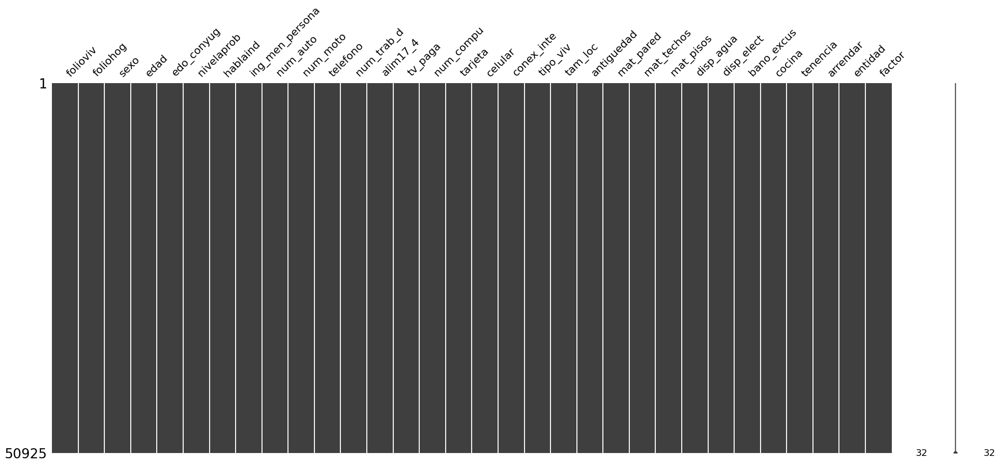

In [131]:
# La matriz muestra que hay completitud de los datos
msno.matrix(objetivo)

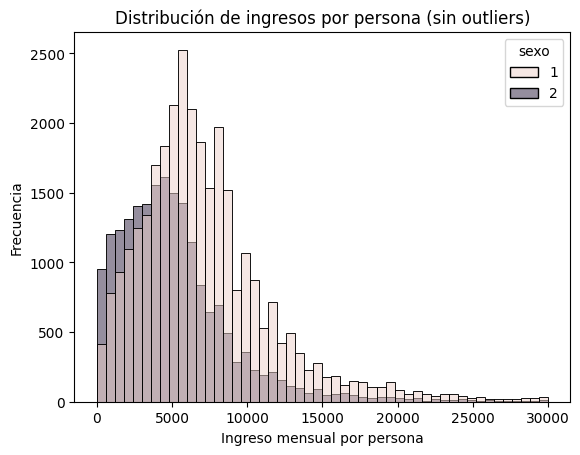

In [132]:
filtered_data = objetivo[objetivo["ing_men_persona"] < 30000]
sns.histplot(data=filtered_data, x="ing_men_persona", hue="sexo",bins=50)
plt.title("Distribución de ingresos por persona (sin outliers)")
plt.xlabel("Ingreso mensual por persona")
plt.ylabel("Frecuencia")
plt.show()

<Axes: xlabel='ing_men_persona', ylabel='Count'>

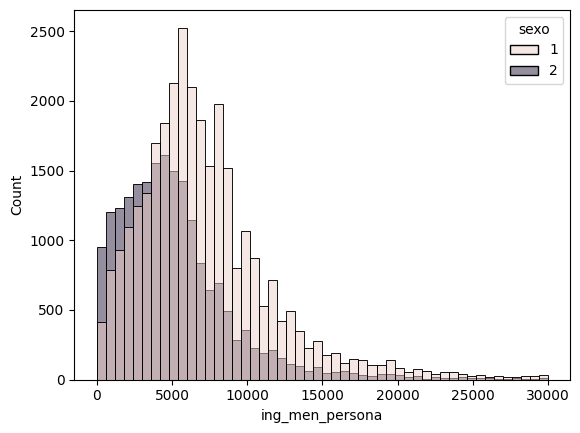

In [133]:
sns.histplot(data=filtered_data, x="ing_men_persona", hue="sexo",bins=50)

In [134]:
filtered_data["sexo"] = filtered_data["sexo"].replace({"Masculino": "Hombre", "Femenino": "Mujer"})

fig = px.histogram(
    filtered_data,
    x="ing_men_persona",
    color="sexo",
    nbins=50,
    title="Distribución de ingresos por persona (sin outliers)",
    labels={"ing_men_persona": "Ingreso mensual por persona"}, 
    opacity=0.8,
    color_discrete_sequence=["#636EFA", "#AB63FA"], 
)

fig.update_layout(
    yaxis_title="Frecuencia",
    title_font=dict(size=20, family="Arial", color="black"),
    xaxis_title_font=dict(size=16, family="Arial", color="black"),
    yaxis_title_font=dict(size=16, family="Arial", color="black"),
    legend_title_font=dict(size=14, family="Arial", color="black"),
    xaxis=dict(tickfont=dict(size=12, family="Arial", color="black")),
    yaxis=dict(tickfont=dict(size=12, family="Arial", color="black")),
    plot_bgcolor="white",
    bargap=0.1,
)

fig.show()

/var/folders/41/pthbls9x1gq8_fgsh6fvh2zc0000gn/T/ipykernel_30750/702858086.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [135]:
filtered_data["sexo"] = filtered_data["sexo"].replace({"Masculino": "Hombre", "Femenino": "Mujer"})

fig = px.histogram(
    filtered_data,
    x="edo_conyug",
    nbins=50,
    title="Distribución de edo conyug",
    labels={"edo_conyug": "Estado Conyugal"}, 
)

fig.update_layout(
    yaxis_title="Frecuencia",
    title_font=dict(size=20, family="Arial", color="black"),
    xaxis_title_font=dict(size=16, family="Arial", color="black"),
    yaxis_title_font=dict(size=16, family="Arial", color="black"),
    legend_title_font=dict(size=14, family="Arial", color="black"),
    xaxis=dict(tickfont=dict(size=12, family="Arial", color="black")),
    yaxis=dict(tickfont=dict(size=12, family="Arial", color="black")),
    plot_bgcolor="white",
    bargap=0.1,
)

fig.show()

/var/folders/41/pthbls9x1gq8_fgsh6fvh2zc0000gn/T/ipykernel_30750/3932428261.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [136]:
objetivo.tam_loc.value_counts()

tam_loc
4    22031
1    14272
3     7774
2     6848
Name: count, dtype: int64

In [137]:
#objetivo.to_csv("objetivo.csv", index=False)

In [138]:
#objetivo.to_excel("objetivo.xlsx", index=False)

In [139]:
gpt = objetivo.head(5)
gpt

,folioviv,foliohog,sexo,edad,edo_conyug,nivelaprob,hablaind,ing_men_persona,num_auto,num_moto,...,mat_techos,mat_pisos,disp_agua,disp_elect,bano_excus,cocina,tenencia,arrendar,entidad,factor
0,100012002,2,1,27,6,4,2,8070.65,1,0,...,10,3,1,1,0,1,4,0,1,167
1,100012004,1,1,18,6,4,2,1304.35,1,0,...,10,3,1,1,1,1,4,0,1,167
2,100019302,1,2,40,6,7,2,3913.04,0,0,...,10,3,1,1,2,1,4,0,1,212
3,100023305,1,1,43,2,4,2,7043.48,2,1,...,10,2,1,1,0,1,2,0,1,184
4,100023305,1,2,35,2,3,2,1369.56,2,1,...,10,2,1,1,0,1,2,0,1,184


In [140]:
import io

In [141]:
print(objetivo["antiguedad"].unique())

['50' '45' '36' '40' '70' ' ' '20' '10' '60' '90' '35' '65' '12' '24' '30'
 '34' '55' '81' '18' '28' '29' '22' '38' '25' '23' '15' '3' '31' '43' '14'
 '1' '32' '16' '5' '48' '54' '27' '26' '13' '33' '2' '11' '17' '6' '19'
 '4' '21' '7' '57' '0' '8' '99' '9' '39' '80' '47' '56' '37' '42' '62'
 '41' '52' '94' '46' '53' '63' '85' '68' '49' '44' '75' '51' '66' '74'
 '64' '86' '59' '58' '69' '98' '61' '72' '83' '82' '67' '91' '71' '79'
 '78' '95' '92' '88' '89' '96' '76' '97' '87' '73' '93']


In [142]:
# Debo poner 
objetivo[objetivo["bano_excus"] == " "]

,folioviv,foliohog,sexo,edad,edo_conyug,nivelaprob,hablaind,ing_men_persona,num_auto,num_moto,...,mat_techos,mat_pisos,disp_agua,disp_elect,bano_excus,cocina,tenencia,arrendar,entidad,factor
84,100447805,1,2,42,1,3,2,5114.75,0,0,...,10,2,1,1,,1,2,0,1,185
902,160047720,1,2,37,3,3,2,629.51,0,0,...,10,2,1,1,,1,2,0,1,56
903,160047720,1,1,18,6,3,2,1254.10,0,0,...,10,2,1,1,,1,2,0,1,56
1230,160179718,1,1,48,2,2,2,9836.06,0,0,...,3,1,5,1,,1,4,0,1,76
1231,160179718,1,2,24,3,2,2,1049.18,0,0,...,3,1,5,1,,1,4,0,1,76
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
50829,3260728002,1,1,23,2,3,2,5478.26,0,1,...,3,2,2,1,,1,4,0,32,246
50830,3260728003,1,1,25,2,3,2,6456.52,0,1,...,3,2,2,1,,2,4,0,32,246
50851,3260755409,1,1,38,2,3,2,7206.52,1,0,...,3,2,1,1,,1,4,0,32,218
50852,3260755409,1,2,35,2,3,2,782.61,1,0,...,3,2,1,1,,1,4,0,32,218


In [143]:
objetivo.isnull().sum()

folioviv           0
foliohog           0
sexo               0
edad               0
edo_conyug         0
nivelaprob         0
hablaind           0
ing_men_persona    0
num_auto           0
num_moto           0
telefono           0
num_trab_d         0
alim17_4           0
tv_paga            0
num_compu          0
tarjeta            0
celular            0
conex_inte         0
tipo_viv           0
tam_loc            0
antiguedad         0
mat_pared          0
mat_techos         0
mat_pisos          0
disp_agua          0
disp_elect         0
bano_excus         0
cocina             0
tenencia           0
arrendar           0
entidad            0
factor             0
dtype: int64

In [144]:
# Debo cambiar los " " a NaN
objetivo["antiguedad"] = objetivo["antiguedad"].replace(" ", np.nan)

In [145]:
# Debo cambiar la variable a número
objetivo["antiguedad"] = pd.to_numeric(objetivo["antiguedad"], errors="coerce")

In [146]:
objetivo.antiguedad.dtype

dtype('float64')

In [147]:
objetivo.antiguedad.describe()

count    43537.000000
mean        21.690240
std         15.105976
min          0.000000
25%         10.000000
50%         20.000000
75%         30.000000
max         99.000000
Name: antiguedad, dtype: float64

In [148]:
objetivo[["antiguedad"]]

,antiguedad
0,50.0
1,45.0
2,36.0
3,50.0
4,50.0
...,...
50920,30.0
50921,30.0
50922,30.0
50923,NaN


In [149]:
# Preparar los datos para imputar la columna antiguedad en valores faltantes
columnas_para_imputar = ["antiguedad", "edad", "ing_men_persona", "nivelaprob"]
datos_para_imputar = objetivo[columnas_para_imputar]

In [150]:
from sklearn.impute import KNNImputer

In [151]:
imputer = KNNImputer(n_neighbors=3)

In [152]:
datos_imputados = imputer.fit_transform(datos_para_imputar)

In [153]:
datos_imputados

array([[5.00000000e+01, 2.70000000e+01, 8.07065000e+03, 4.00000000e+00],
       [4.50000000e+01, 1.80000000e+01, 1.30435000e+03, 4.00000000e+00],
       [3.60000000e+01, 4.00000000e+01, 3.91304000e+03, 7.00000000e+00],
       ...,
       [3.00000000e+01, 5.00000000e+01, 8.47820000e+02, 2.00000000e+00],
       [1.83333333e+01, 3.70000000e+01, 8.80435000e+03, 2.00000000e+00],
       [3.40000000e+01, 2.90000000e+01, 8.11956000e+03, 7.00000000e+00]])

In [154]:
num_filas = len(datos_imputados)
print(f"Número de filas: {num_filas}")

Número de filas: 50925


In [155]:
objetivo["antiguedad"] = datos_imputados

In [156]:
objetivo[["antiguedad"]]

,antiguedad
0,50.000000
1,45.000000
2,36.000000
3,50.000000
4,50.000000
...,...
50920,30.000000
50921,30.000000
50922,30.000000
50923,18.333333


In [157]:
objetivo["antiguedad"] = objetivo["antiguedad"].astype(int)
objetivo[["antiguedad"]]

,antiguedad
0,50
1,45
2,36
3,50
4,50
...,...
50920,30
50921,30
50922,30
50923,18


In [158]:
objetivo.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50925 entries, 0 to 50924
Data columns (total 32 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   folioviv         50925 non-null  int64  
 1   foliohog         50925 non-null  int64  
 2   sexo             50925 non-null  int64  
 3   edad             50925 non-null  int64  
 4   edo_conyug       50925 non-null  object 
 5   nivelaprob       50925 non-null  object 
 6   hablaind         50925 non-null  object 
 7   ing_men_persona  50925 non-null  float64
 8   num_auto         50925 non-null  int64  
 9   num_moto         50925 non-null  int64  
 10  telefono         50925 non-null  int64  
 11  num_trab_d       50925 non-null  int64  
 12  alim17_4         50925 non-null  int64  
 13  tv_paga          50925 non-null  int64  
 14  num_compu        50925 non-null  int64  
 15  tarjeta          50925 non-null  int64  
 16  celular          50925 non-null  int64  
 17  conex_inte  

In [159]:
objetivo[objetivo["bano_excus"] == " "]

,folioviv,foliohog,sexo,edad,edo_conyug,nivelaprob,hablaind,ing_men_persona,num_auto,num_moto,...,mat_techos,mat_pisos,disp_agua,disp_elect,bano_excus,cocina,tenencia,arrendar,entidad,factor
84,100447805,1,2,42,1,3,2,5114.75,0,0,...,10,2,1,1,,1,2,0,1,185
902,160047720,1,2,37,3,3,2,629.51,0,0,...,10,2,1,1,,1,2,0,1,56
903,160047720,1,1,18,6,3,2,1254.10,0,0,...,10,2,1,1,,1,2,0,1,56
1230,160179718,1,1,48,2,2,2,9836.06,0,0,...,3,1,5,1,,1,4,0,1,76
1231,160179718,1,2,24,3,2,2,1049.18,0,0,...,3,1,5,1,,1,4,0,1,76
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
50829,3260728002,1,1,23,2,3,2,5478.26,0,1,...,3,2,2,1,,1,4,0,32,246
50830,3260728003,1,1,25,2,3,2,6456.52,0,1,...,3,2,2,1,,2,4,0,32,246
50851,3260755409,1,1,38,2,3,2,7206.52,1,0,...,3,2,1,1,,1,4,0,32,218
50852,3260755409,1,2,35,2,3,2,782.61,1,0,...,3,2,1,1,,1,4,0,32,218


In [160]:
modaBanoExcus = objetivo["bano_excus"].mode()
print(modaBanoExcus)

0    0
Name: bano_excus, dtype: object


In [161]:
modaBanoExcus = "0"
print(modaBanoExcus)

0


In [162]:
objetivo["bano_excus"] = objetivo["bano_excus"].replace(" ", "0")

In [163]:
print(objetivo["bano_excus"].unique())

['0' '1' '2' '3' '4' '9' '8' '6' '7' '5']


In [164]:
objetivo

,folioviv,foliohog,sexo,edad,edo_conyug,nivelaprob,hablaind,ing_men_persona,num_auto,num_moto,...,mat_techos,mat_pisos,disp_agua,disp_elect,bano_excus,cocina,tenencia,arrendar,entidad,factor
0,100012002,2,1,27,6,4,2,8070.65,1,0,...,10,3,1,1,0,1,4,0,1,167
1,100012004,1,1,18,6,4,2,1304.35,1,0,...,10,3,1,1,1,1,4,0,1,167
2,100019302,1,2,40,6,7,2,3913.04,0,0,...,10,3,1,1,2,1,4,0,1,212
3,100023305,1,1,43,2,4,2,7043.48,2,1,...,10,2,1,1,0,1,2,0,1,184
4,100023305,1,2,35,2,3,2,1369.56,2,1,...,10,2,1,1,0,1,2,0,1,184
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
50920,3260797907,1,1,28,2,3,2,10402.17,1,1,...,3,2,1,1,0,1,1,1,32,123
50921,3260797908,1,1,52,2,3,2,4108.69,1,0,...,3,2,1,1,0,1,5,0,32,123
50922,3260797908,1,2,50,2,2,2,847.82,1,0,...,3,2,1,1,0,1,5,0,32,123
50923,3260797909,1,1,37,2,2,2,8804.35,1,1,...,10,2,1,1,0,1,1,1,32,123


In [165]:
objetivo["mat_pisos"] = objetivo["mat_pisos"].astype(int)

In [166]:
objetivo["bano_excus"] = objetivo["bano_excus"].astype(int)

In [167]:
objetivo.tipo_viv.unique()

array(['1', '3', '2', '5', '&', '4'], dtype=object)

In [168]:
objetivo.tipo_viv.mode()

0    1
Name: tipo_viv, dtype: object

In [169]:
objetivo['tipo_viv'] = objetivo['tipo_viv'].replace('&', '1')

In [170]:
objetivo.tipo_viv.unique()

array(['1', '3', '2', '5', '4'], dtype=object)

# Transformación de los Datos

In [171]:
print(objetivo.sexo.unique())
print(objetivo.hablaind.unique())
print(objetivo.telefono.unique())
print(objetivo.tv_paga.unique())
print(objetivo.tarjeta.unique())
print(objetivo.celular.unique())
print(objetivo.conex_inte.unique())
print(objetivo.cocina.unique())

[1 2]
['2' '1']
[2 1]
[2 1]
[2 1]
[1 2]
[2 1]
[1 2]


In [172]:
# Mantener un estándar para las categorías sí y no
objetivo['cocina'] = objetivo['cocina'].apply(lambda x: 1 if x == 1 else 0)

In [173]:
# ELIMINÉ TENENCIA, HABLAIND Y COCINA
one_hot_encoding_vars = [
    "edo_conyug", "tipo_viv", "tam_loc", "mat_pared",
    "mat_techos", "mat_pisos", "disp_agua", "disp_elect",
    "entidad"
]

label_encoding_vars = [
    "sexo", "telefono", "tv_paga",
    "tarjeta", "celular", "conex_inte",
    "nivelaprob", "arrendar"
]

In [174]:
datos = objetivo.drop(columns=["folioviv", "foliohog", "factor"])

In [175]:
## Eliminar hablaind y cocina
datos = datos.drop(columns=['cocina', 'hablaind', 'tenencia'])

In [176]:
for col in datos.columns:
    print(f"Columna: {col}")
    print(datos[col].unique())
    print("-" * 30)

Columna: sexo
[1 2]
------------------------------
Columna: edad
[27 18 40 43 35 42 39 51 24 46 28 50 58 36 57 31 25 19 20 56 26 33 23 30
 47 59 52 49 21 29 45 32 22 34 48 38 41 37 53 44 54 60 55]
------------------------------
Columna: edo_conyug
['6' '2' '1' '4' '3' '5']
------------------------------
Columna: nivelaprob
['4' '7' '3' '6' '2' '8' '0' '9' '1' '5']
------------------------------
Columna: ing_men_persona
[ 8070.65  1304.35  3913.04 ...  1857.68 15929.02  3797.54]
------------------------------
Columna: num_auto
[1 0 2 4 3 6 5 7 9 8]
------------------------------
Columna: num_moto
[0 1 2 3 4 6 7 5]
------------------------------
Columna: telefono
[2 1]
------------------------------
Columna: num_trab_d
[0 1 2]
------------------------------
Columna: alim17_4
[4 7 6 5 3 0 1 2]
------------------------------
Columna: tv_paga
[2 1]
------------------------------
Columna: num_compu
[1 3 0 4 2 5 6 8]
------------------------------
Columna: tarjeta
[2 1]
----------------------

In [177]:
from sklearn.preprocessing import LabelEncoder

In [178]:
le = LabelEncoder()

for i in label_encoding_vars:
    datos[i] = le.fit_transform(datos[i])

In [179]:
datos = pd.get_dummies(datos, columns=one_hot_encoding_vars, drop_first=True)

In [180]:
corr_matrix = datos.corr()

corr_df = corr_matrix.reset_index().melt(id_vars="index")
corr_df.columns = ["Variable1", "Variable2", "Correlation"]

fig = px.imshow(
    corr_matrix,
    title="Matríz de Correlación",
    labels=dict(x="Variables X", y="Variables Y", color="Correlación"),
    color_continuous_scale="Picnic",
    zmin=-1, zmax=1
)
fig.update_layout(
    width=800,
    height=800,
    xaxis_title="Variables",
    yaxis_title="Variables"
)
fig.show()

In [181]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

pruebaCorr = datos.select_dtypes(include=['float64', 'int64'])

vif_data = pd.DataFrame()
vif_data["Variable"] = pruebaCorr.columns
vif_data["VIF"] = [variance_inflation_factor(pruebaCorr.values, i) for i in range(pruebaCorr.shape[1])]

print(vif_data.sort_values(by="VIF", ascending=False))

           Variable       VIF
1              edad  7.157532
2        nivelaprob  5.449735
6          telefono  5.326742
11          tarjeta  4.227210
8          alim17_4  3.454499
14       antiguedad  3.189887
9           tv_paga  2.780688
13       conex_inte  2.597319
10        num_compu  1.695331
0              sexo  1.688448
15       bano_excus  1.661847
4          num_auto  1.542962
3   ing_men_persona  1.440164
5          num_moto  1.209454
16         arrendar  1.174913
12          celular  1.110898
7        num_trab_d  1.007003


In [182]:
datos.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50925 entries, 0 to 50924
Data columns (total 88 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   sexo             50925 non-null  int64  
 1   edad             50925 non-null  int64  
 2   nivelaprob       50925 non-null  int64  
 3   ing_men_persona  50925 non-null  float64
 4   num_auto         50925 non-null  int64  
 5   num_moto         50925 non-null  int64  
 6   telefono         50925 non-null  int64  
 7   num_trab_d       50925 non-null  int64  
 8   alim17_4         50925 non-null  int64  
 9   tv_paga          50925 non-null  int64  
 10  num_compu        50925 non-null  int64  
 11  tarjeta          50925 non-null  int64  
 12  celular          50925 non-null  int64  
 13  conex_inte       50925 non-null  int64  
 14  antiguedad       50925 non-null  int64  
 15  bano_excus       50925 non-null  int64  
 16  arrendar         50925 non-null  int64  
 17  edo_conyug_2

# Regresión Lineal

In [183]:
X = datos.drop(columns=['arrendar'])
y = datos['arrendar']

In [184]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

print("Tamaño del conjunto de entrenamiento:", X_train.shape)
print("Tamaño del conjunto de prueba:", X_test.shape)

Tamaño del conjunto de entrenamiento: (35647, 87)
Tamaño del conjunto de prueba: (15278, 87)


In [185]:
# Probar esclado y sin escalar
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()

X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [186]:
from sklearn.linear_model import LogisticRegression

model = LogisticRegression(random_state=42, max_iter=1000)

model.fit(X_train_scaled, y_train)

LogisticRegression(max_iter=1000, random_state=42)

In [187]:
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

y_pred = model.predict(X_test_scaled)

print("Reporte de clasificación:\n", classification_report(y_test, y_pred))

print("Precisión del modelo:", accuracy_score(y_test, y_pred))

cm = confusion_matrix(y_test, y_pred)
print("Matriz de confusión:\n", cm)

Reporte de clasificación:
               precision    recall  f1-score   support

           0       0.88      0.99      0.93     13256
           1       0.65      0.15      0.25      2022

    accuracy                           0.88     15278
   macro avg       0.77      0.57      0.59     15278
weighted avg       0.85      0.88      0.84     15278

Precisión del modelo: 0.8768163372169132
Matriz de confusión:
 [[13088   168]
 [ 1714   308]]


In [188]:
import joblib

joblib.dump(model, "regresion_sin_optimizar.pkl")

['regresion_sin_optimizar.pkl']

In [189]:
print(X.columns)

Index(['sexo', 'edad', 'nivelaprob', 'ing_men_persona', 'num_auto', 'num_moto',
       'telefono', 'num_trab_d', 'alim17_4', 'tv_paga', 'num_compu', 'tarjeta',
       'celular', 'conex_inte', 'antiguedad', 'bano_excus', 'edo_conyug_2',
       'edo_conyug_3', 'edo_conyug_4', 'edo_conyug_5', 'edo_conyug_6',
       'tipo_viv_2', 'tipo_viv_3', 'tipo_viv_4', 'tipo_viv_5', 'tam_loc_2',
       'tam_loc_3', 'tam_loc_4', 'mat_pared_2', 'mat_pared_3', 'mat_pared_4',
       'mat_pared_5', 'mat_pared_6', 'mat_pared_7', 'mat_pared_8',
       'mat_techos_2', 'mat_techos_3', 'mat_techos_4', 'mat_techos_5',
       'mat_techos_6', 'mat_techos_7', 'mat_techos_8', 'mat_techos_9',
       'mat_techos_10', 'mat_pisos_2', 'mat_pisos_3', 'disp_agua_2',
       'disp_agua_3', 'disp_agua_4', 'disp_agua_5', 'disp_agua_6',
       'disp_agua_7', 'disp_elect_2', 'disp_elect_3', 'disp_elect_4',
       'disp_elect_5', 'entidad_2', 'entidad_3', 'entidad_4', 'entidad_5',
       'entidad_6', 'entidad_7', 'entidad_8', 'en

In [190]:
from sklearn.metrics import roc_auc_score
y_prob = model.predict_proba(X_test_scaled)[:, 1]
print("ROC-AUC:", roc_auc_score(y_test, y_prob))

ROC-AUC: 0.7971713684175339


In [191]:
from sklearn.metrics import roc_curve, auc
import plotly.graph_objects as go

fpr, tpr, _ = roc_curve(y_test, y_prob)
roc_auc = auc(fpr, tpr)

fig = go.Figure()

fig.add_trace(go.Scatter(
    x=fpr, 
    y=tpr,
    mode='lines',
    name=f'ROC curve (AUC = {roc_auc:.2f})',
    line=dict(color='darkorange', width=2)
))
fig.add_trace(go.Scatter(
    x=[0, 1], 
    y=[0, 1],
    mode='lines',
    name='Random Guess',
    line=dict(color='navy', width=2, dash='dash')
))
fig.update_layout(
    title='Curva ROC',
    xaxis_title='False Positive Rate',
    yaxis_title='True Positive Rate',
    xaxis=dict(showgrid=True, zeroline=False),
    yaxis=dict(showgrid=True, zeroline=False),
    legend=dict(x=0.7, y=0.2),
    template='plotly_white'
)
fig.show()

In [192]:
from sklearn.model_selection import GridSearchCV

param_grid = {
    "C": [0.01, 0.1, 1, 10, 100],
    "penalty": ["l1", "l2"],
    "solver": ["liblinear"]
}

grid_search = GridSearchCV(LogisticRegression(random_state=41, max_iter=1000), param_grid, cv=5, scoring="roc_auc")
grid_search.fit(X_train_scaled, y_train)

print("Mejores parámetros:", grid_search.best_params_)
model = grid_search.best_estimator_

Mejores parámetros: {'C': 0.1, 'penalty': 'l1', 'solver': 'liblinear'}


In [193]:
y_pred = model.predict(X_test_scaled)

print("Reporte de clasificación:\n", classification_report(y_test, y_pred))

print("Precisión del modelo:", accuracy_score(y_test, y_pred))

cm = confusion_matrix(y_test, y_pred)
print("Matriz de confusión:\n", cm)

Reporte de clasificación:
               precision    recall  f1-score   support

           0       0.88      0.99      0.93     13256
           1       0.66      0.15      0.24      2022

    accuracy                           0.88     15278
   macro avg       0.77      0.57      0.59     15278
weighted avg       0.85      0.88      0.84     15278

Precisión del modelo: 0.87701269799712
Matriz de confusión:
 [[13100   156]
 [ 1723   299]]


In [194]:
joblib.dump(model, "regresion_optimizado_cross.pkl")

['regresion_optimizado_cross.pkl']

In [195]:
y_prob = model.predict_proba(X_test_scaled)[:, 1]
print("ROC-AUC:", roc_auc_score(y_test, y_prob))

ROC-AUC: 0.7968830119738998


In [196]:
from sklearn.metrics import roc_curve, auc
import plotly.graph_objects as go

fpr, tpr, _ = roc_curve(y_test, y_prob)
roc_auc = auc(fpr, tpr)

fig = go.Figure()

fig.add_trace(go.Scatter(
    x=fpr, 
    y=tpr,
    mode='lines',
    name=f'ROC curve (AUC = {roc_auc:.2f})',
    line=dict(color='darkorange', width=2)
))
fig.add_trace(go.Scatter(
    x=[0, 1], 
    y=[0, 1],
    mode='lines',
    name='Random Guess',
    line=dict(color='navy', width=2, dash='dash')
))
fig.update_layout(
    title='Curva ROC',
    xaxis_title='False Positive Rate',
    yaxis_title='True Positive Rate',
    xaxis=dict(showgrid=True, zeroline=False),
    yaxis=dict(showgrid=True, zeroline=False),
    legend=dict(x=0.7, y=0.2),
    template='plotly_white'
)
fig.show()

# XGBoost

In [197]:
from xgboost import XGBClassifier
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score

xgb_model = XGBClassifier(
    random_state=42,
    use_label_encoder=False,
    eval_metric="logloss"
)

xgb_model.fit(X_train, y_train)

y_pred = xgb_model.predict(X_test)
y_prob = xgb_model.predict_proba(X_test)[:, 1]

print("Reporte de clasificación:\n", classification_report(y_test, y_pred))
print("ROC-AUC:", roc_auc_score(y_test, y_prob))

cm = confusion_matrix(y_test, y_pred)
print("Matriz de confusión:\n", cm)

/Users/emanuelalarcon/Documents/vscWorkspace/tecEconomia/proyectoFinal/.venv/lib/python3.13/site-packages/xgboost/core.py:158: UserWarning:

[18:05:09] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.




Reporte de clasificación:
               precision    recall  f1-score   support

           0       0.89      0.98      0.94     13256
           1       0.66      0.23      0.34      2022

    accuracy                           0.88     15278
   macro avg       0.78      0.60      0.64     15278
weighted avg       0.86      0.88      0.86     15278

ROC-AUC: 0.8256934731830372
Matriz de confusión:
 [[13018   238]
 [ 1563   459]]


In [198]:
joblib.dump(xgb_model, "xgb_sin_optimizar.pkl")

['xgb_sin_optimizar.pkl']

In [199]:
from sklearn.model_selection import GridSearchCV

param_grid = {
    "learning_rate": [0.01, 0.1, 0.2],
    "max_depth": [3, 5, 7],
    "n_estimators": [50, 100, 200],
    "subsample": [0.8, 1.0],
    "colsample_bytree": [0.8, 1.0]
}

xgb_base = XGBClassifier(random_state=42, use_label_encoder=False, eval_metric="logloss")

grid_search = GridSearchCV(xgb_base, param_grid, cv=5, scoring="roc_auc", n_jobs=-1)
grid_search.fit(X_train, y_train)

print("Mejores parámetros:", grid_search.best_params_)

xgb_best = grid_search.best_estimator_

/Users/emanuelalarcon/Documents/vscWorkspace/tecEconomia/proyectoFinal/.venv/lib/python3.13/site-packages/xgboost/core.py:158: UserWarning: [18:05:11] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/Users/emanuelalarcon/Documents/vscWorkspace/tecEconomia/proyectoFinal/.venv/lib/python3.13/site-packages/xgboost/core.py:158: UserWarning: [18:05:11] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/Users/emanuelalarcon/Documents/vscWorkspace/tecEconomia/proyectoFinal/.venv/lib/python3.13/site-packages/xgboost/core.py:158: UserWarning: [18:05:11] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/Users/emanuelalarcon/Documents/vscWorkspace/tecEconomia/proyectoFinal/.venv/lib/python3.13/si

Mejores parámetros: {'colsample_bytree': 0.8, 'learning_rate': 0.1, 'max_depth': 7, 'n_estimators': 200, 'subsample': 1.0}


In [200]:
xgb_best

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.8, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric='logloss',
              feature_types=None, gamma=None, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=0.1, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=7,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=200,
              n_jobs=None, num_parallel_tree=None, random_state=42, ...)

In [201]:
y_pred = xgb_best.predict(X_test)
y_prob = xgb_best.predict_proba(X_test)[:, 1]

from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score

print("Reporte de clasificación:\n", classification_report(y_test, y_pred))
print("ROC-AUC:", roc_auc_score(y_test, y_prob))

cm = confusion_matrix(y_test, y_pred)
print("Matriz de confusión:\n", cm)

Reporte de clasificación:
               precision    recall  f1-score   support

           0       0.89      0.98      0.94     13256
           1       0.69      0.22      0.33      2022

    accuracy                           0.88     15278
   macro avg       0.79      0.60      0.63     15278
weighted avg       0.87      0.88      0.86     15278

ROC-AUC: 0.834219892289224
Matriz de confusión:
 [[13057   199]
 [ 1578   444]]


In [202]:
joblib.dump(xgb_best, "xgb_optimizado_gridsearch.pkl")

['xgb_optimizado_gridsearch.pkl']

<Figure size 1000x800 with 0 Axes>

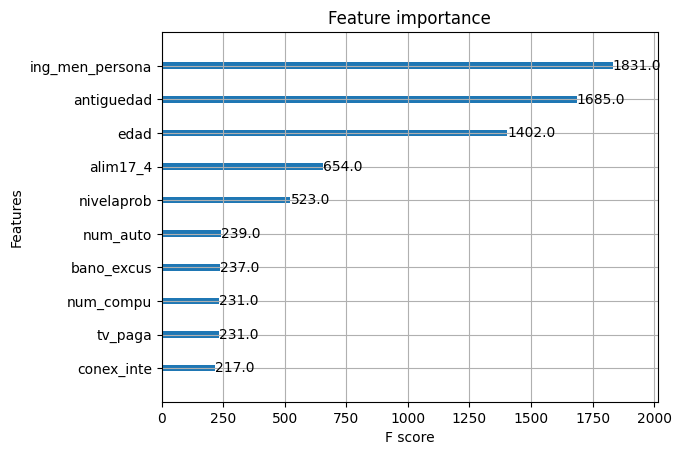

In [203]:
import matplotlib.pyplot as plt
from xgboost import plot_importance

# Visualizar la importancia de las características
plt.figure(figsize=(10, 8))
plot_importance(xgb_best, max_num_features=10)  # Muestra las 10 características más importantes
plt.show()

In [204]:
importance = xgb_best.get_booster().get_score(importance_type='weight')
importance_df = pd.DataFrame({
    'Feature': list(importance.keys()),
    'Importance': list(importance.values())
}).sort_values(by='Importance', ascending=False)

top_10_features = importance_df.head(10)

fig = px.bar(
    top_10_features,
    x='Importance',
    y='Feature',
    orientation='h',
    title='Top 10 Features by Importance',
    labels={'Importance': 'Feature Importance', 'Feature': 'Features'},
    height=500
)

fig.update_layout(yaxis=dict(categoryorder='total ascending'))

fig.show()

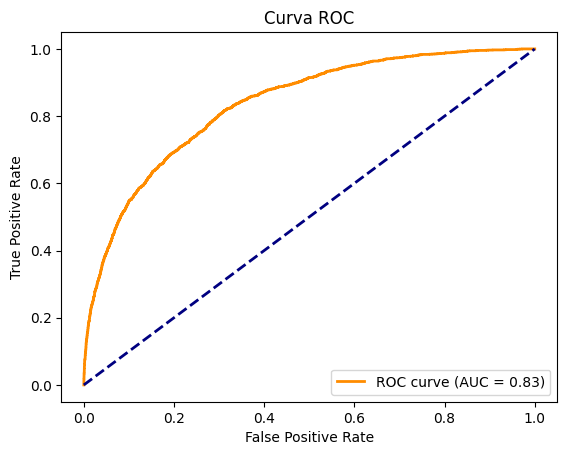

In [205]:
from sklearn.metrics import roc_curve, auc

fpr, tpr, _ = roc_curve(y_test, y_prob)
roc_auc = auc(fpr, tpr)

plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Curva ROC')
plt.legend(loc='lower right')
plt.show()

In [206]:
import plotly.graph_objects as go

fpr, tpr, _ = roc_curve(y_test, y_prob)
roc_auc = auc(fpr, tpr)

fig = go.Figure()

fig.add_trace(go.Scatter(
    x=fpr, 
    y=tpr,
    mode='lines',
    name=f'ROC curve (AUC = {roc_auc:.2f})',
    line=dict(color='darkorange', width=2)
))
fig.add_trace(go.Scatter(
    x=[0, 1], 
    y=[0, 1],
    mode='lines',
    name='Random Guess',
    line=dict(color='navy', width=2, dash='dash')
))
fig.update_layout(
    title='Curva ROC',
    xaxis_title='False Positive Rate',
    yaxis_title='True Positive Rate',
    xaxis=dict(showgrid=True, zeroline=False),
    yaxis=dict(showgrid=True, zeroline=False),
    legend=dict(x=0.7, y=0.2),
    template='plotly_white'
)
fig.show()

# Análisis de Resultados

In [207]:
regresion_sin_optimizar = joblib.load("regresion_sin_optimizar.pkl")
regresion_optimizado = joblib.load("regresion_optimizado_cross.pkl")
xgb_sin_optimizar = joblib.load("xgb_sin_optimizar.pkl")
xgb_optimizado = joblib.load("xgb_optimizado_gridsearch.pkl")

In [ ]:
modelos = {
    "Regresión Sin Optimizar": regresion_sin_optimizar,
    "Regresión Optimizada": regresion_optimizado,
    "XGBoost Sin Optimizar": xgb_sin_optimizar,
    "XGBoost Optimizado": xgb_optimizado
}

resultados = {}

for nombre, modelo in modelos.items():
    y_pred = model.predict(X_test_scaled)
    y_prob = model.predict

In [209]:
import shap

ModuleNotFoundError: No module named 'shap'

In [ ]:

# Crear un explainer para el modelo
explainer = shap.Explainer(xgb_optimizado, X_train)
shap_values = explainer(X_test)

# Resumen del impacto global
shap.summary_plot(shap_values, X_test)

# Resumen por observación individual
shap.force_plot(explainer.expected_value[1], shap_values[0], X_test.iloc[0])

# Proly TRASH

In [ ]:
objetivo = pd.get_dummies(objetivo, columns=["edo_conyug"], prefix="edo_conyug",drop_first=True)

In [ ]:
objetivo

In [ ]:
print(objetivo["hablaind"].unique())
print(objetivo["hablaind"].dtype)

In [ ]:
objetivo["hablaind"] = objetivo["hablaind"].apply(lambda x: 1 if x == "1" else 0)

In [ ]:
print(objetivo["hablaind"].unique())
print(objetivo["hablaind"].dtype)

In [ ]:
objetivo = pd.get_dummies(objetivo, columns=["hablaind"], drop_first=True)

In [ ]:
objetivo

In [ ]:
from sklearn.preprocessing import LabelEncoder

In [ ]:
le = LabelEncoder()

In [ ]:
objetivo["nivelaprob"] = le.fit_transform(objetivo["nivelaprob"])

In [ ]:
objetivo[["nivelaprob"]]

In [ ]:
objetivo.nivelaprob.dtype

In [ ]:
objetivo = pd.get_dummies(objetivo, columns=["tipo_viv"], drop_first=True)

In [ ]:
objetivo

In [ ]:
objetivo.mat_pisos.unique()

In [ ]:
objetivo["mat_pisos"] = objetivo["mat_pisos"].astype(str)

In [ ]:
objetivo.mat_pisos.unique()

In [ ]:
objetivo.mat_pisos.info()

In [ ]:
objetivo = pd.get_dummies(objetivo, columns=["mat_pisos"], drop_first=True)

In [ ]:
objetivo

In [ ]:
objetivo.bano_excus.unique()

In [ ]:
objetivo["bano_excus"] = objetivo["bano_excus"].astype(int)

In [ ]:
objetivo.bano_excus.describe()

In [ ]:
objetivo.info()

In [ ]:
datos = objetivo.drop(columns=["folioviv", "foliohog", "factor"])

In [ ]:
datos

In [ ]:
corr_matrix = datos.corr()

In [ ]:
corr_df = corr_matrix.reset_index().melt(id_vars="index")
corr_df.columns = ["Variable1", "Variable2", "Correlation"]

In [ ]:
fig = px.imshow(
    corr_matrix,
    title="Matríz de Correlación",
    labels=dict(x="Variables", y="Variables", color="Correlación"),
    color_continuous_scale="Picnic",
    zmin=-1, zmax=1
)
fig.update_layout(
    width=800,
    height=800,
    xaxis_title="Variables",
    yaxis_title="Variables"
)
fig.show()